# Importing the data

In [10]:
# Importing necessary libraries:
from datetime import datetime
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Defining the list of tech stocks and time period:
tech_list = ['AMD', 'EA', 'AAPL']
start = datetime(2001, 1, 1)
end = datetime(2023, 11, 30)
# Downloading stock data and assigning to variables with stock symbols:
company_list = []
for stock, com_name in zip(tech_list, ["AMD", "ELECTRONIC ARTS", "APPLE"]):
    # Download stock data
    stock_data = yf.download(stock, start, end)
    # Add company name as a new column
    stock_data['company_name'] = com_name
    # Append to the company_list
    company_list.append(stock_data)
# Concatenating DataFrames for the selected companies:
df = pd.concat(company_list, axis=0)
# Renaming the index column to 'Date':
df.index.name = 'Date'
# Displaying the shape of the resulting DataFrame for each company:
for company, com_name in zip(company_list, ["AMD", "ELECTRONIC ARTS", "APPLE"]):
    print(f"{com_name}: {company.shape[0]}")
# Displaying the date range
print(f"Date Range: {df.index.min().date()} to {df.index.max().date()}")
df.head()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
AMD: 5764
ELECTRONIC ARTS: 5764
APPLE: 5764
Date Range: 2001-01-02 to 2023-11-29


,Open,High,Low,Close,Adj Close,Volume,company_name
Date,,,,,,,
2001-01-02,14.1250,14.7500,14.1250,14.3750,14.3750,4863600,AMD
2001-01-03,14.5000,16.3750,14.4375,16.2500,16.2500,8808100,AMD
2001-01-04,16.1250,17.3750,15.7500,16.6875,16.6875,7045000,AMD
2001-01-05,17.1875,17.1875,15.6875,16.0000,16.0000,5230600,AMD
2001-01-08,15.9375,16.2500,15.4375,16.1875,16.1875,3365700,AMD


# Visualizing the data

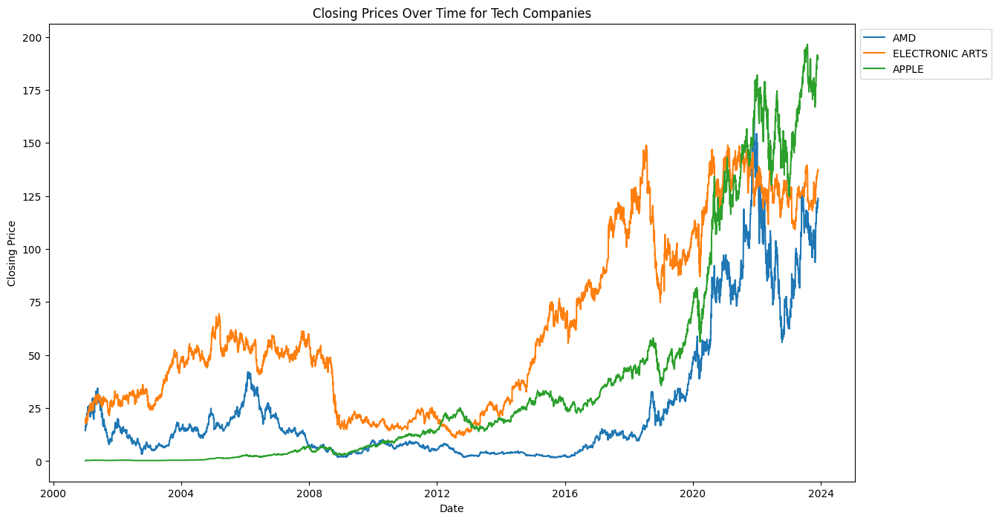

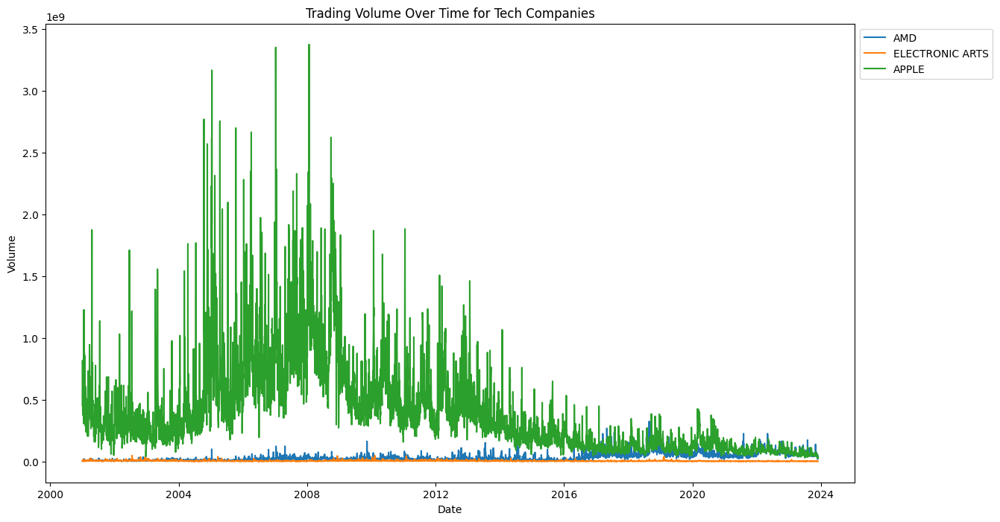

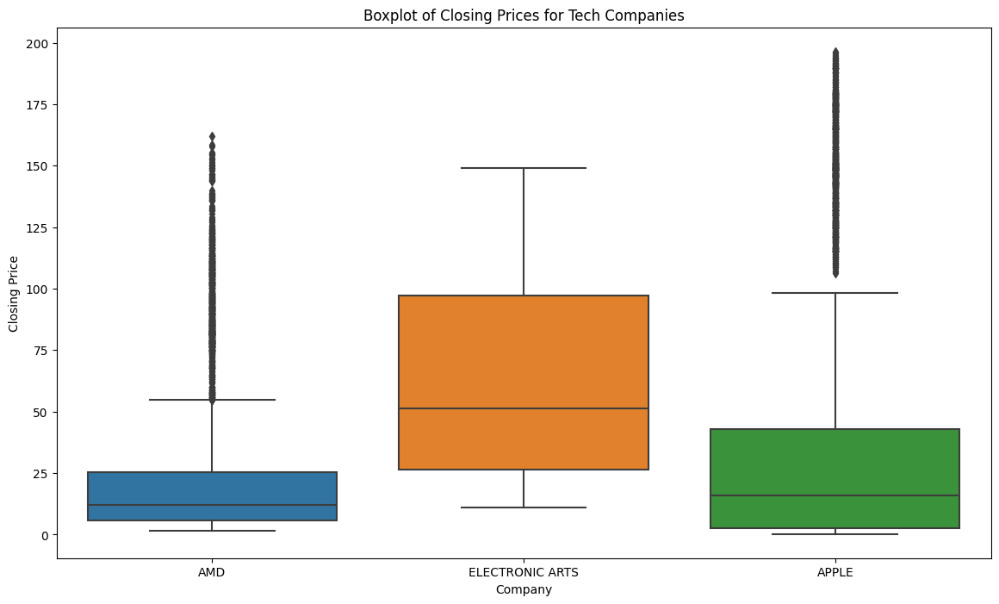

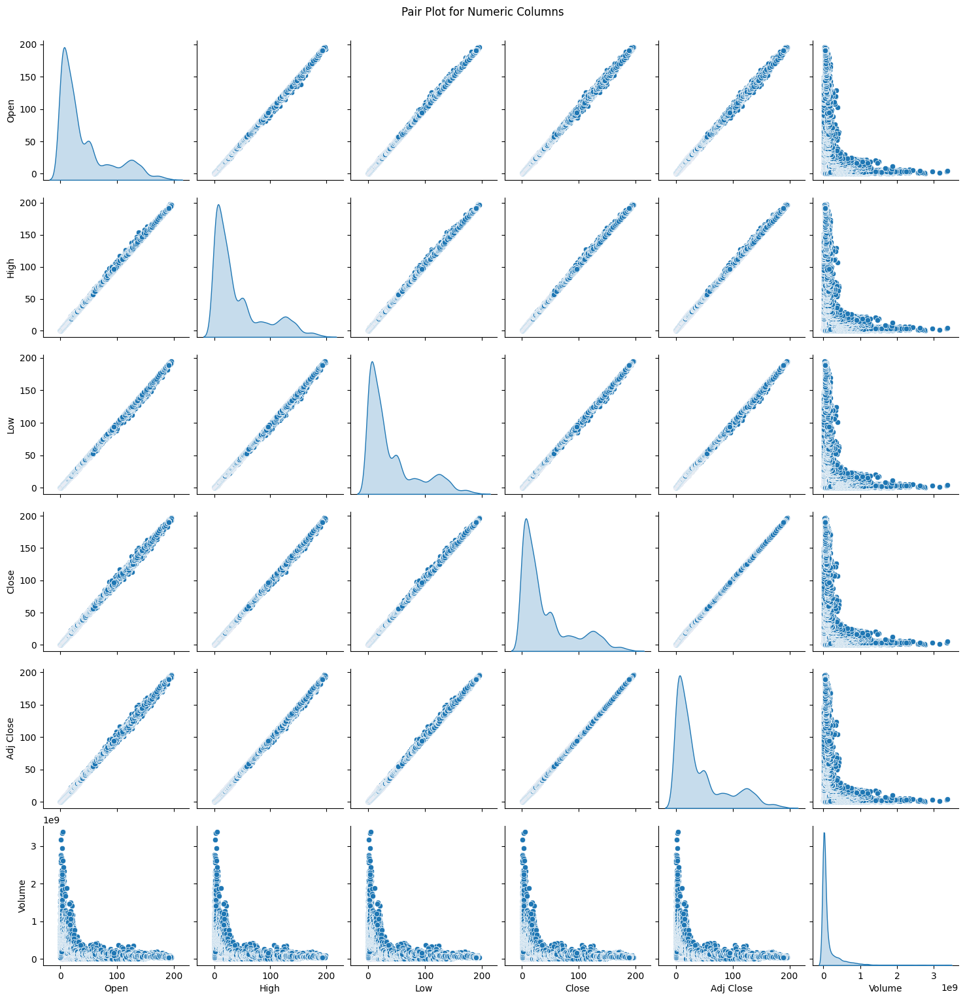

In [2]:
# Plotting the closing prices for each company over time
plt.figure(figsize=(14, 8))
sns.lineplot(x='Date', y='Close', hue='company_name', data=df)
plt.title('Closing Prices Over Time for Tech Companies')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()
# Plotting the trading volume for each company over time
plt.figure(figsize=(14, 8))
sns.lineplot(x='Date', y='Volume', hue='company_name', data=df)
plt.title('Trading Volume Over Time for Tech Companies')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()
# Boxplot of closing prices for each company
plt.figure(figsize=(14, 8))
sns.boxplot(x='company_name', y='Close', data=df)
plt.title('Boxplot of Closing Prices for Tech Companies')
plt.xlabel('Company')
plt.ylabel('Closing Price')
plt.show()
# Pair plot for numeric columns
numeric_columns = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']
sns.pairplot(df[numeric_columns], diag_kind='kde')
plt.suptitle('Pair Plot for Numeric Columns', y=1.02)
plt.show()

# Preparing the Data

AMD - 1-year Range:
  Training data size: 200
  Testing data size: 51
  Start date: 2022-11-30 - End date: 2023-11-29
AMD - 3-year Range:
  Training data size: 604
  Testing data size: 151
  Start date: 2020-11-30 - End date: 2023-11-29
AMD - 5-year Range:
  Training data size: 1005
  Testing data size: 252
  Start date: 2018-11-30 - End date: 2023-11-29
AMD - 10-year Range:
  Training data size: 2012
  Testing data size: 504
  Start date: 2013-12-02 - End date: 2023-11-29
AMD - 22-year Range:
  Training data size: 4429
  Testing data size: 1108
  Start date: 2001-11-30 - End date: 2023-11-29


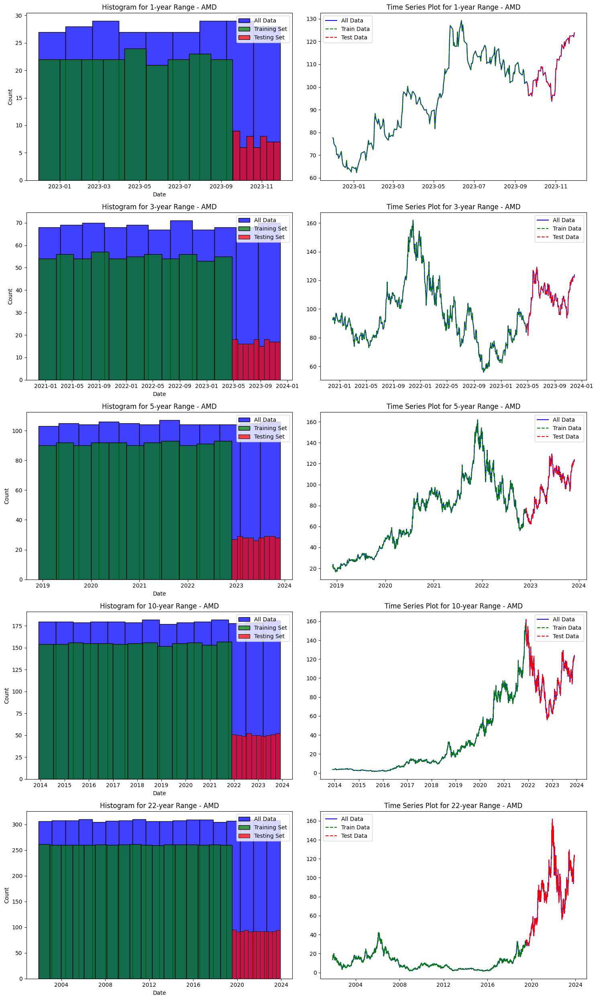

ELECTRONIC ARTS - 1-year Range:
  Training data size: 200
  Testing data size: 51
  Start date: 2022-11-30 - End date: 2023-11-29
ELECTRONIC ARTS - 3-year Range:
  Training data size: 604
  Testing data size: 151
  Start date: 2020-11-30 - End date: 2023-11-29
ELECTRONIC ARTS - 5-year Range:
  Training data size: 1005
  Testing data size: 252
  Start date: 2018-11-30 - End date: 2023-11-29
ELECTRONIC ARTS - 10-year Range:
  Training data size: 2012
  Testing data size: 504
  Start date: 2013-12-02 - End date: 2023-11-29
ELECTRONIC ARTS - 22-year Range:
  Training data size: 4429
  Testing data size: 1108
  Start date: 2001-11-30 - End date: 2023-11-29


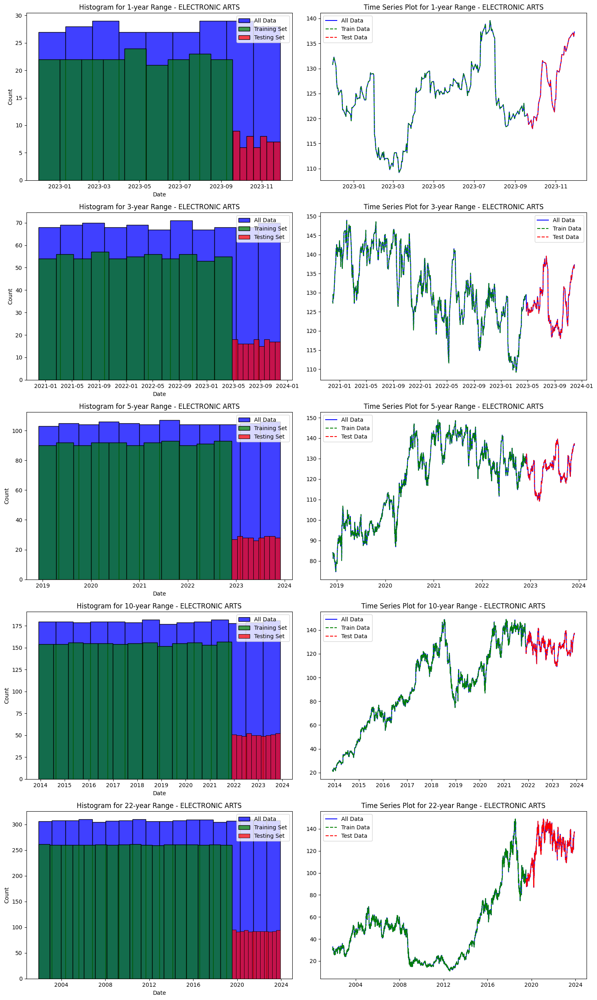

APPLE - 1-year Range:
  Training data size: 200
  Testing data size: 51
  Start date: 2022-11-30 - End date: 2023-11-29
APPLE - 3-year Range:
  Training data size: 604
  Testing data size: 151
  Start date: 2020-11-30 - End date: 2023-11-29
APPLE - 5-year Range:
  Training data size: 1005
  Testing data size: 252
  Start date: 2018-11-30 - End date: 2023-11-29
APPLE - 10-year Range:
  Training data size: 2012
  Testing data size: 504
  Start date: 2013-12-02 - End date: 2023-11-29
APPLE - 22-year Range:
  Training data size: 4429
  Testing data size: 1108
  Start date: 2001-11-30 - End date: 2023-11-29


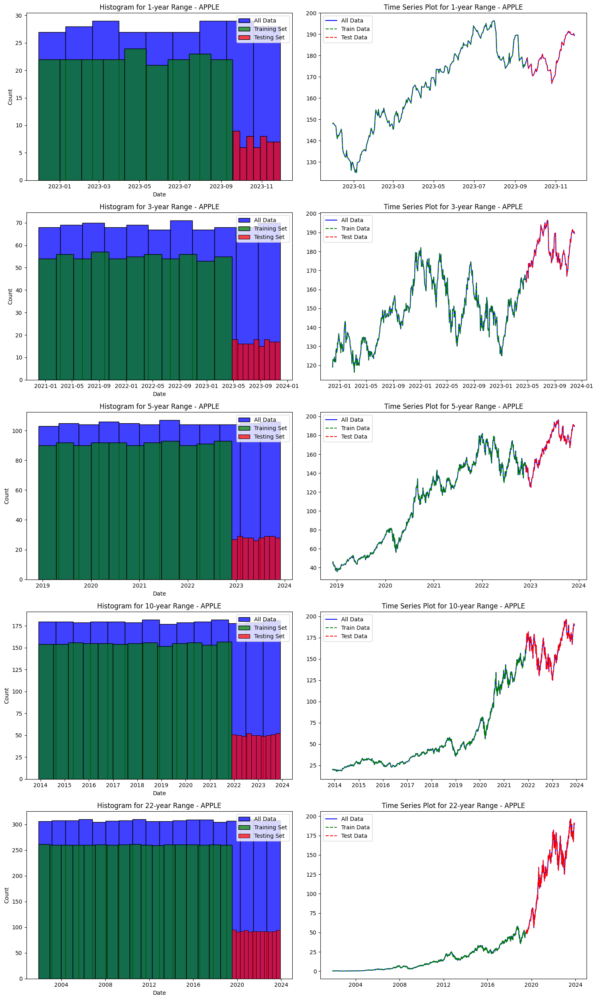

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split

# Function to create train-test splits and perform analysis for Step 2
def create_splits_and_visualizations_step2(data, company_name, time_ranges):
    # Creating a figure with subplots for visualizations
    fig, axes = plt.subplots(len(time_ranges), 2, figsize=(15, 5 * len(time_ranges)))
    for i, time_range in enumerate(time_ranges):
        # Extracting data for the specified time range
        subset_data = data[data.index >= (end - pd.DateOffset(years=time_range))]
        # Train-test split (80% train, 20% test)
        train_data, test_data = train_test_split(subset_data, test_size=0.2, shuffle=False)
        # Visualization 1: Histogram for all data, training set, and testing set
        sns.histplot(data=subset_data, x='Date', ax=axes[i, 0], color='blue', label='All Data')
        sns.histplot(data=train_data, x='Date', ax=axes[i, 0], color='green', label='Training Set', alpha=0.7)
        sns.histplot(data=test_data, x='Date', ax=axes[i, 0], color='red', label='Testing Set', alpha=0.7)
        axes[i, 0].set_title(f'Histogram for {time_range}-year Range - {company_name}')
        axes[i, 0].legend()
        # Visualization 2: Time series plot
        axes[i, 1].plot(subset_data.index, subset_data['Close'], label='All Data', color='blue')
        axes[i, 1].plot(train_data.index, train_data['Close'], label='Train Data', linestyle='--', color='green')
        axes[i, 1].plot(test_data.index, test_data['Close'], label='Test Data', linestyle='--', color='red')
        axes[i, 1].set_title(f'Time Series Plot for {time_range}-year Range - {company_name}')
        axes[i, 1].legend()
        # Printing information about the train-test split
        print(f"{company_name} - {time_range}-year Range:")
        print(f"  Training data size: {len(train_data)}")
        print(f"  Testing data size: {len(test_data)}")
        print(f"  Start date: {train_data.index.min().date()} - End date: {test_data.index.max().date()}")
    # Adjusting layout
    plt.tight_layout()
    plt.show()

# Applying the function for each company
for company, com_name in zip(company_list, ["AMD", "ELECTRONIC ARTS", "APPLE"]):
    full_range_years = (end - start).days // 365
    create_splits_and_visualizations_step2(company, com_name, [1, 3, 5, 10, full_range_years])


# Model, Training, Predection and Evaluation

In [4]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 7.4 MB/s eta 0:00:00



AMD - 1-year Range - Linear Regression Evaluation:
  MSE: 0.8493702471047194
  MAE: 0.7680616621582047
  RMSE: 0.9216128509871807
  MAPE: 0.7260375789718243
  R2 Score: 0.9894191111551051


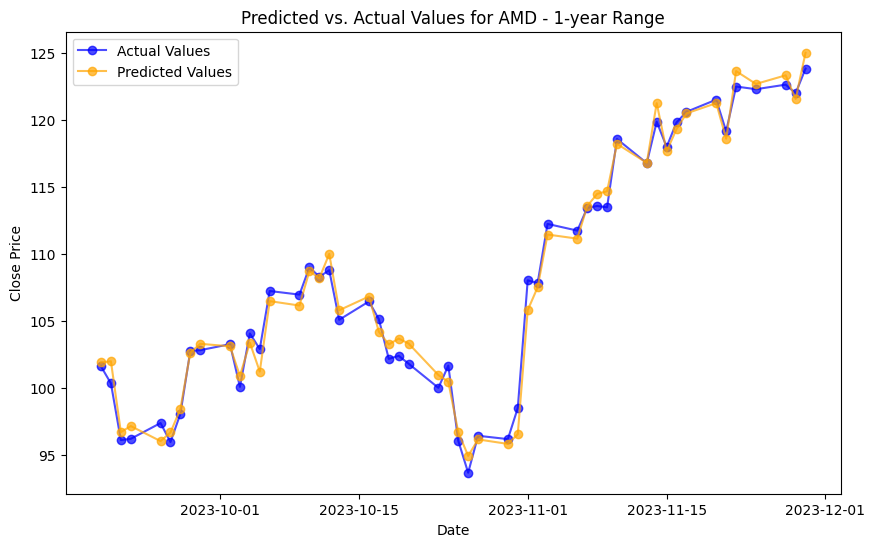


AMD - 1-year Range - Decision Trees Evaluation:
  MSE: 4.8937077009673775
  MAE: 1.7013724831973804
  RMSE: 2.2121726200654814
  MAPE: 1.568917182911391
  R2 Score: 0.9390374487452959


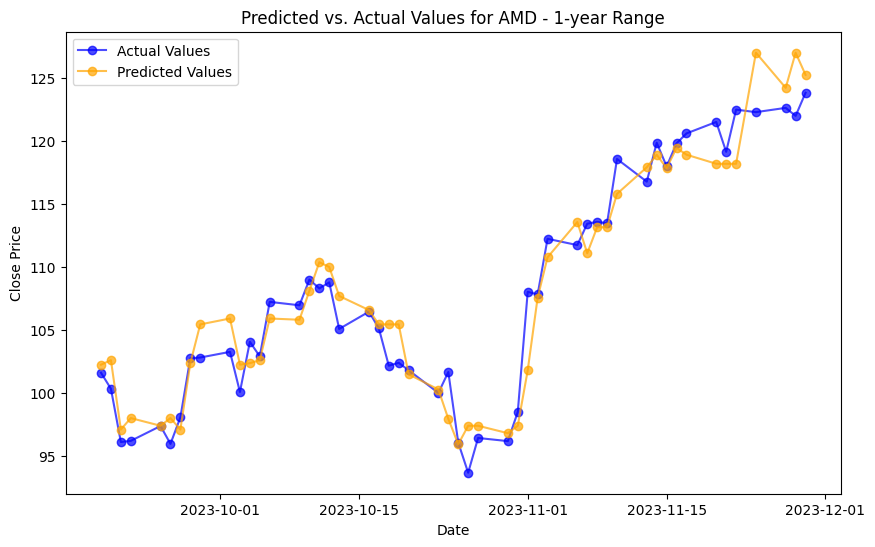

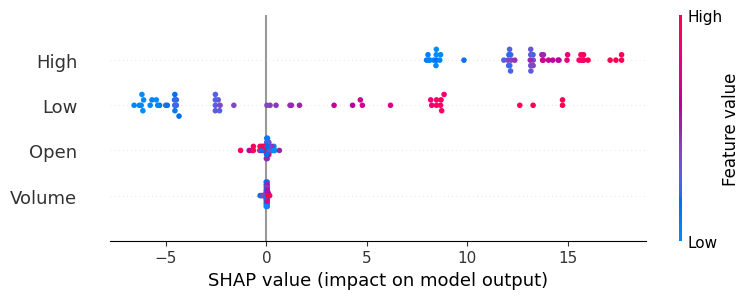

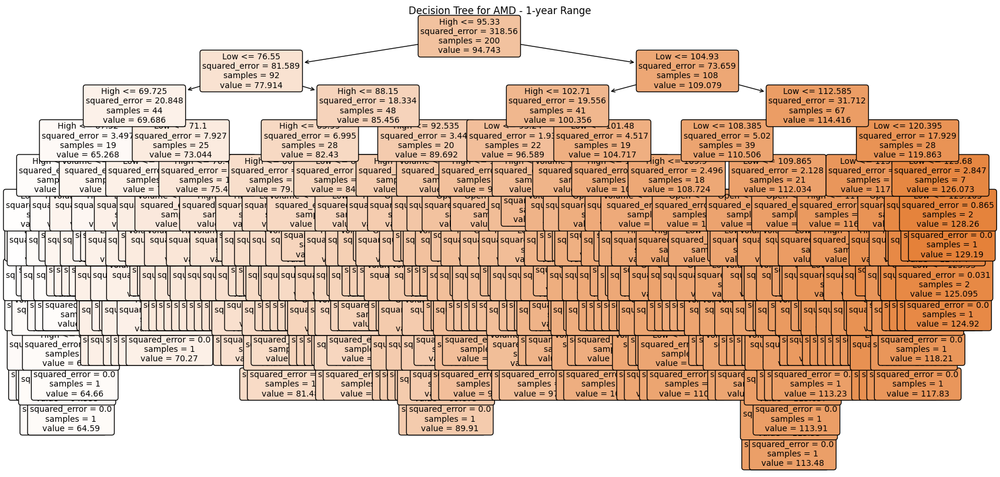

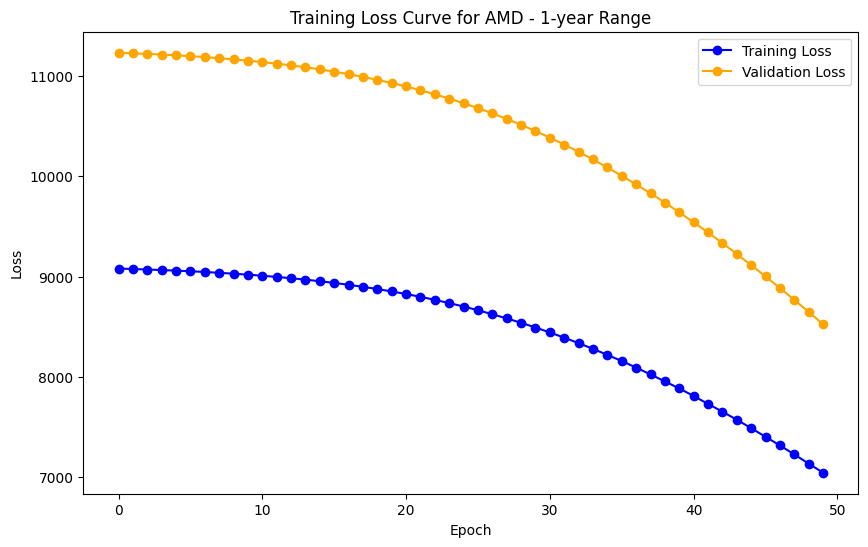

2/2 [==============================] - 0s 16ms/step

AMD - 1-year Range - LSTM Evaluation:
  MSE: 8833.457405029516
  MAE: 93.7537628248626
  RMSE: 93.98647458559937
  MAPE: 86.91618256477992
  R2 Score: -109.04132913453454


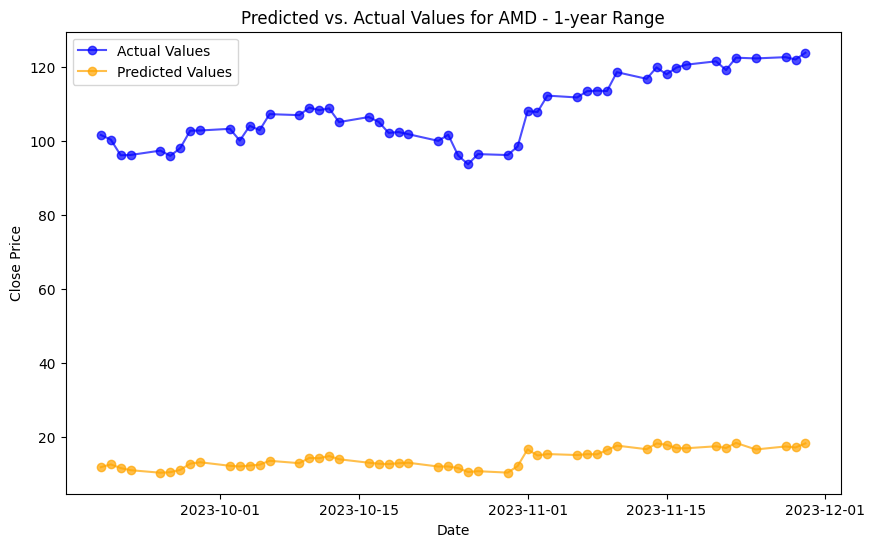


AMD - 3-year Range - Linear Regression Evaluation:
  MSE: 1.2804875011235963
  MAE: 0.8928705770610691
  RMSE: 1.1315862764825297
  MAPE: 0.826676893633016
  R2 Score: 0.9855988502274309


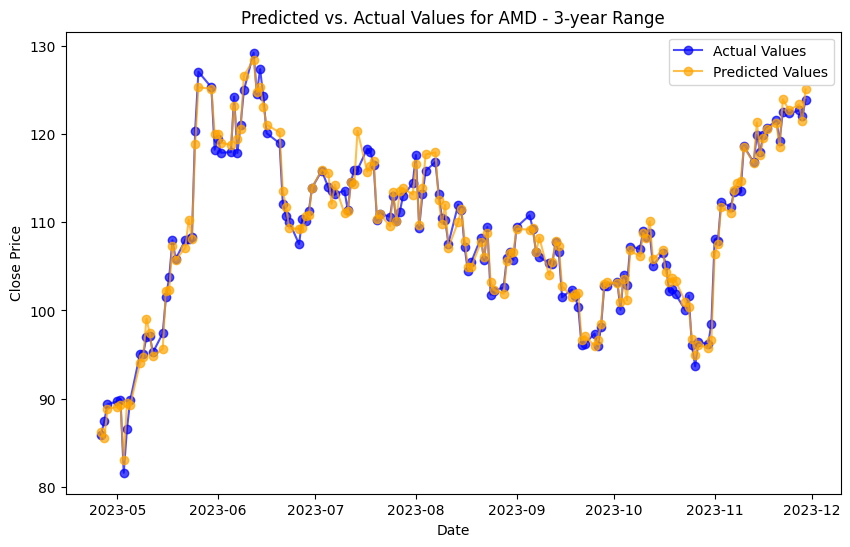


AMD - 3-year Range - Decision Trees Evaluation:
  MSE: 5.118747638472948
  MAE: 1.649072609200383
  RMSE: 2.2624649474572966
  MAPE: 1.5205141669973279
  R2 Score: 0.9424314166870433


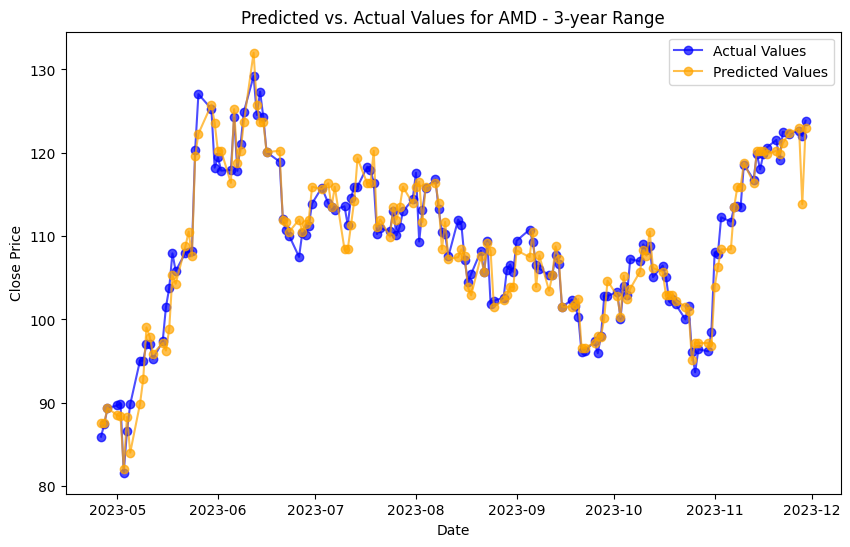

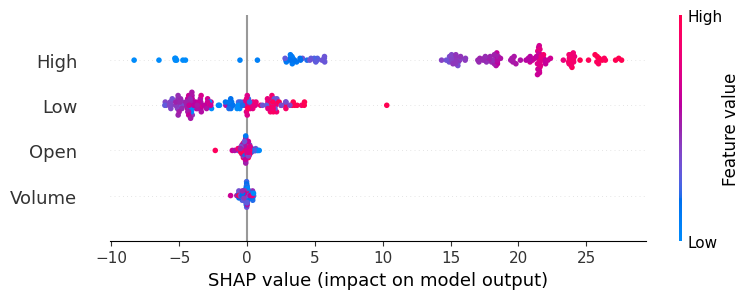

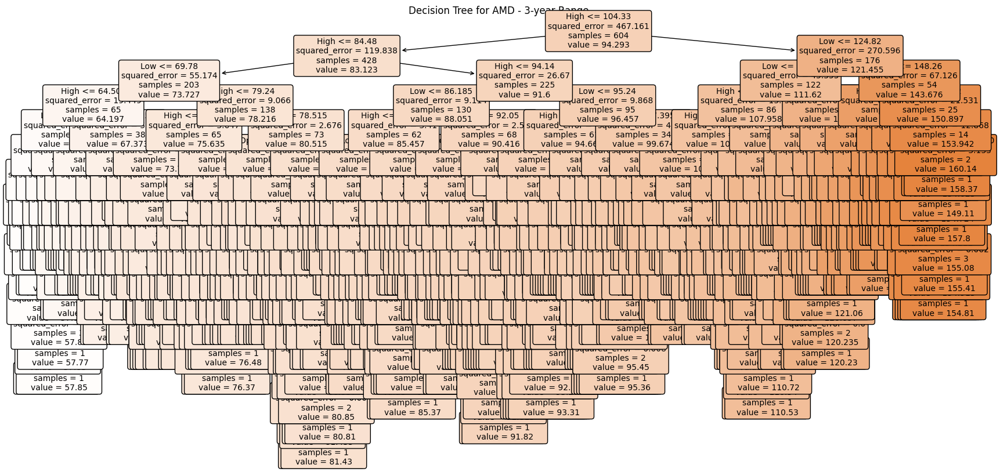

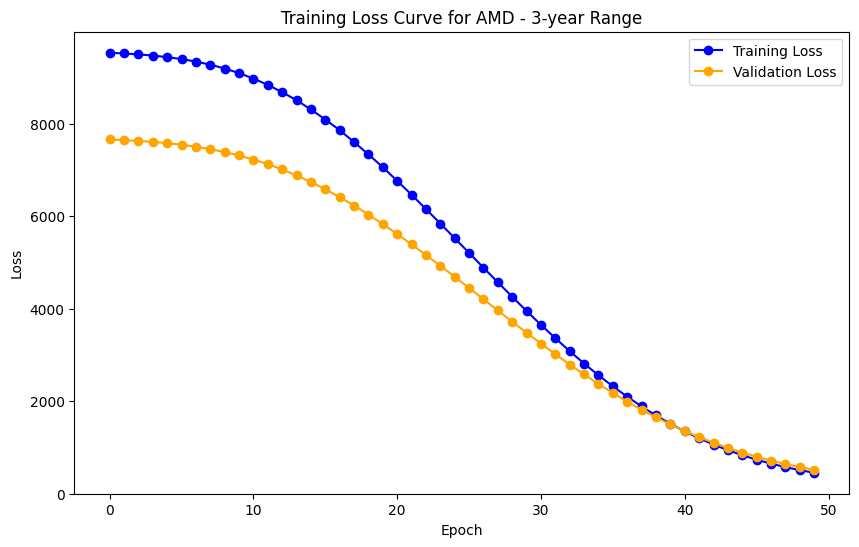

5/5 [==============================] - 0s 6ms/step

AMD - 3-year Range - LSTM Evaluation:
  MSE: 330.5342963369743
  MAE: 17.585041829292347
  RMSE: 18.180602199514027
  MAPE: 17.750417044252366
  R2 Score: -2.7173919326371134


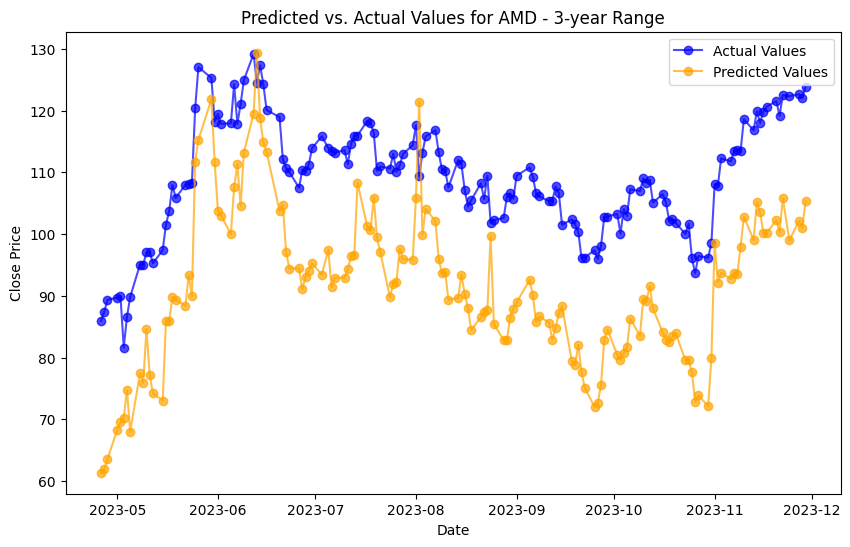


AMD - 5-year Range - Linear Regression Evaluation:
  MSE: 1.099019853474105
  MAE: 0.8174152087803175
  RMSE: 1.0483414775129833
  MAPE: 0.8496737613788996
  R2 Score: 0.9963201688843932


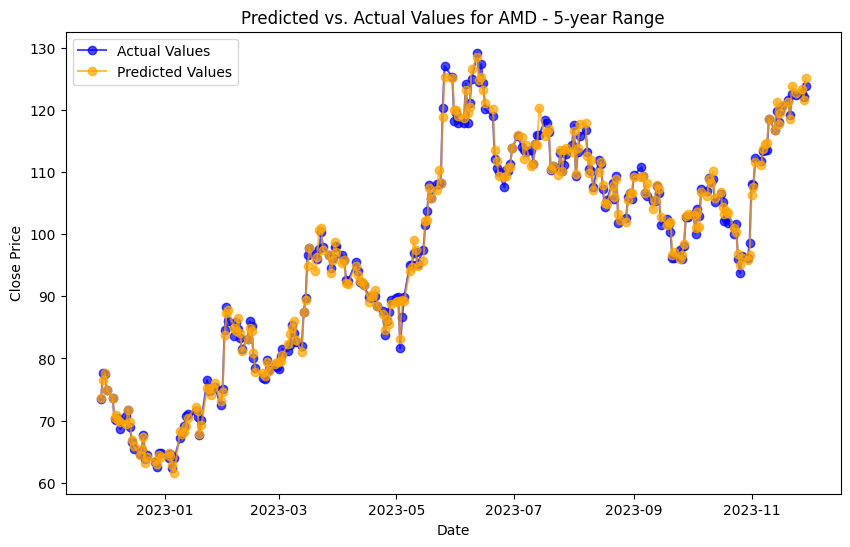


AMD - 5-year Range - Decision Trees Evaluation:
  MSE: 4.144910060008399
  MAE: 1.5155953149946908
  RMSE: 2.035905218817516
  MAPE: 1.5673478711018356
  R2 Score: 0.9861216619863638


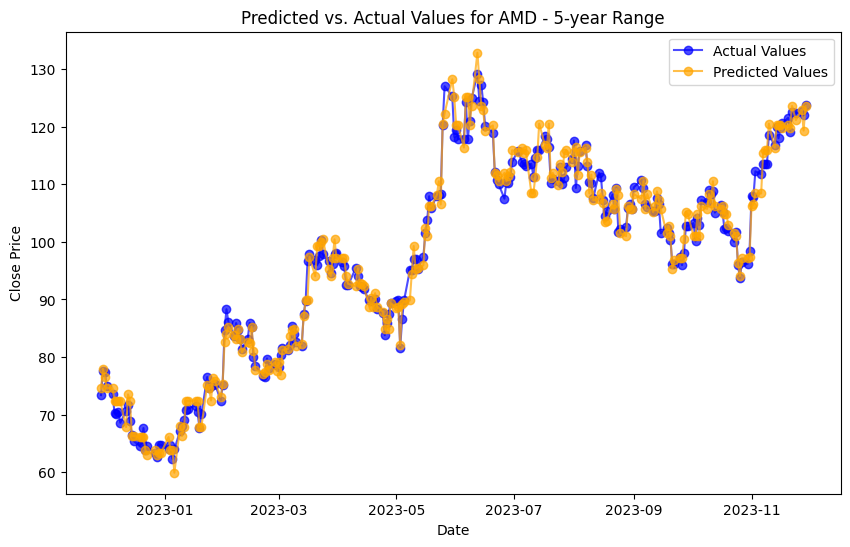

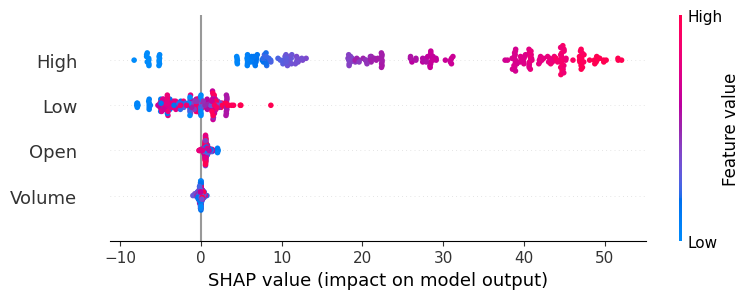

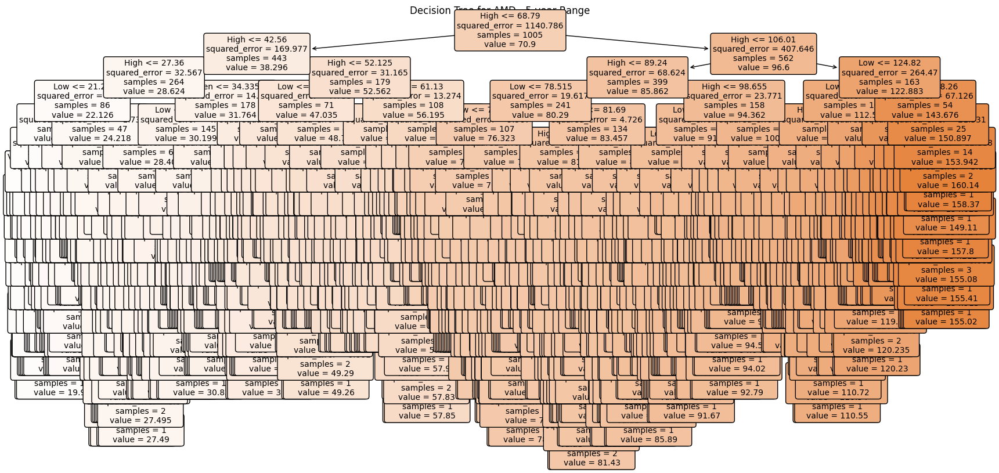

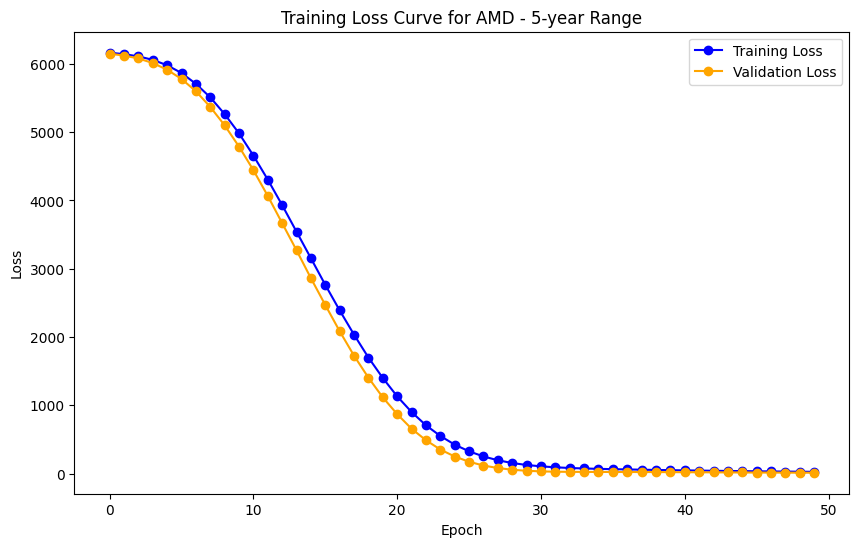

8/8 [==============================] - 0s 4ms/step

AMD - 5-year Range - LSTM Evaluation:
  MSE: 13.487951258747513
  MAE: 3.015132359095982
  RMSE: 3.6725946221639427
  MAPE: 21.5313293373232
  R2 Score: 0.9548385021700642


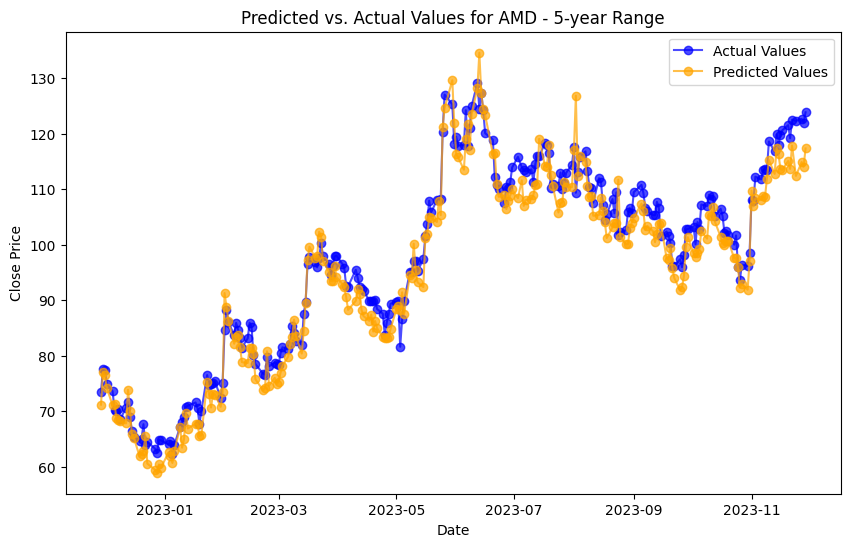


AMD - 10-year Range - Linear Regression Evaluation:
  MSE: 1.642529780480837
  MAE: 0.9847999938238803
  RMSE: 1.2816121802171034
  MAPE: 1.0136200088868654
  R2 Score: 0.9964728584208256


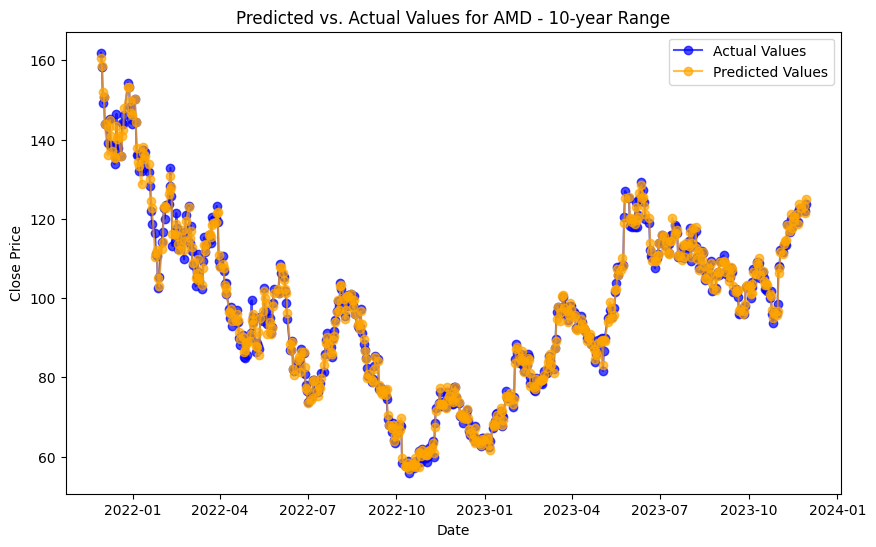


AMD - 10-year Range - Decision Trees Evaluation:
  MSE: 7.347418267106655
  MAE: 1.9390081905183338
  RMSE: 2.7106121572638635
  MAPE: 2.0392039740072905
  R2 Score: 0.9842222742153807


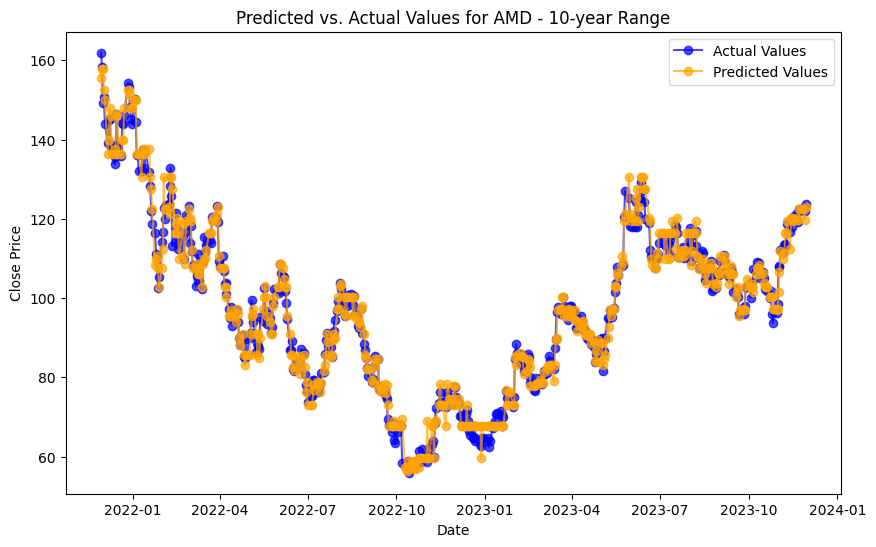

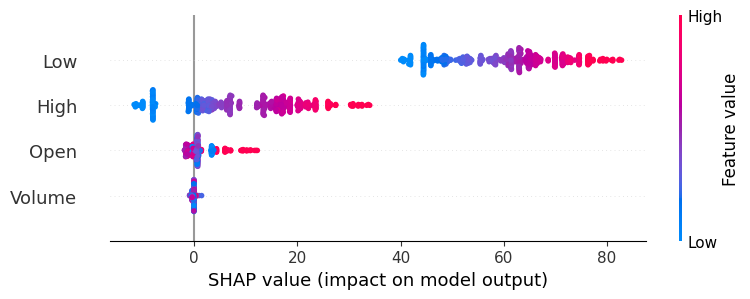

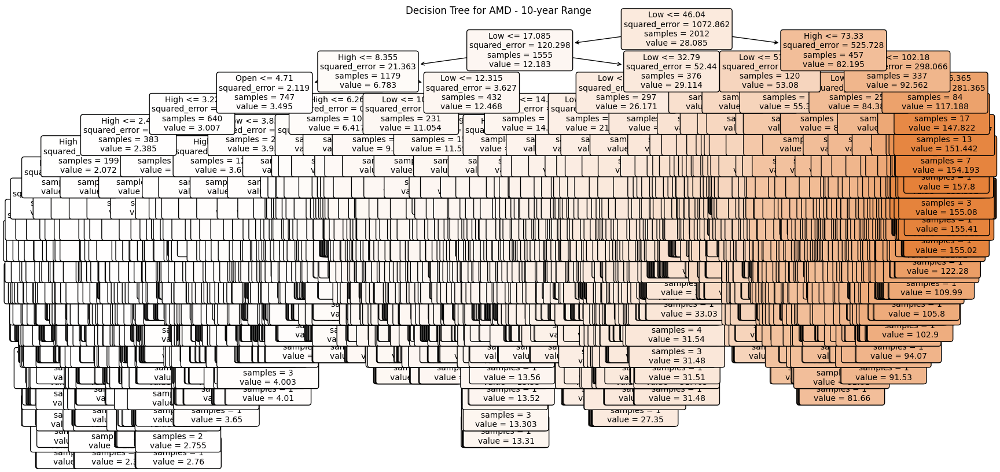

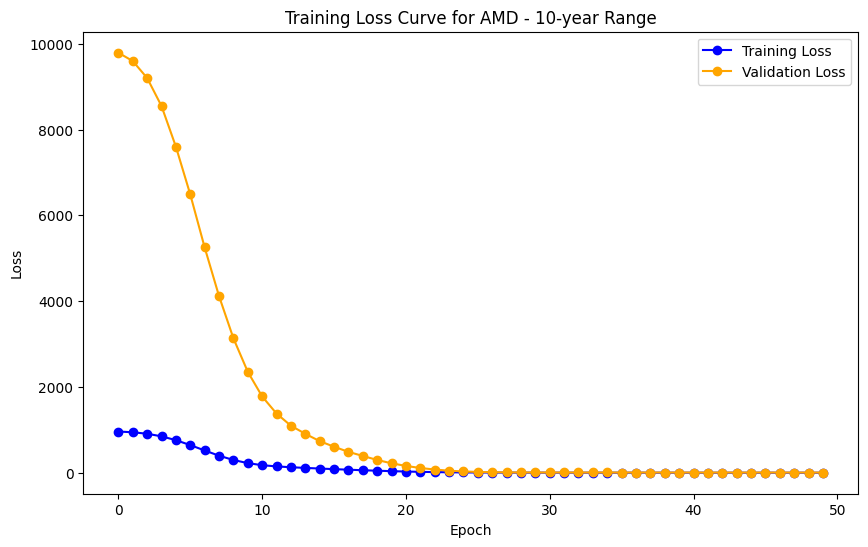

16/16 [==============================] - 0s 3ms/step

AMD - 10-year Range - LSTM Evaluation:
  MSE: 10.459402349019491
  MAE: 2.355166238451761
  RMSE: 3.2340999287312524
  MAPE: 26.53832683109955
  R2 Score: 0.9775396505092642


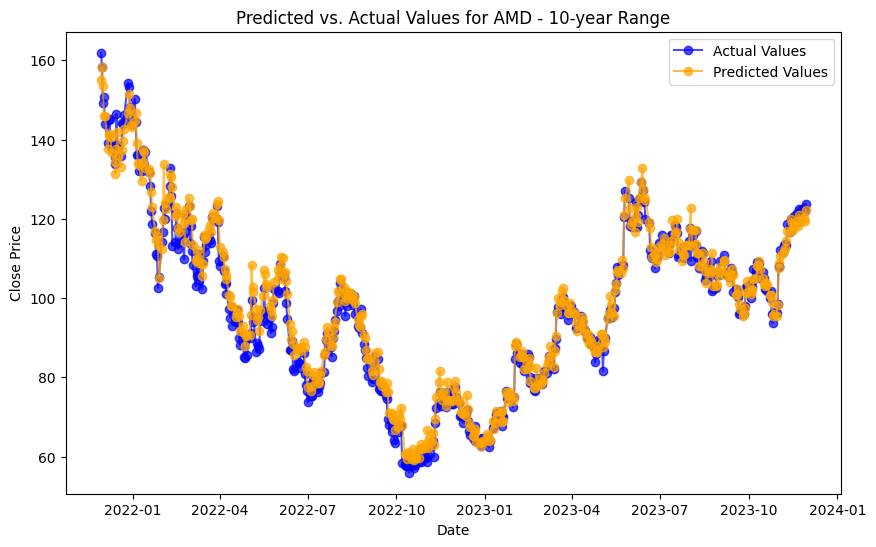


AMD - 22-year Range - Linear Regression Evaluation:
  MSE: 1.1156784831216724
  MAE: 0.7542876357358915
  RMSE: 1.0562568263077272
  MAPE: 0.9092984403082387
  R2 Score: 0.9986516288594385


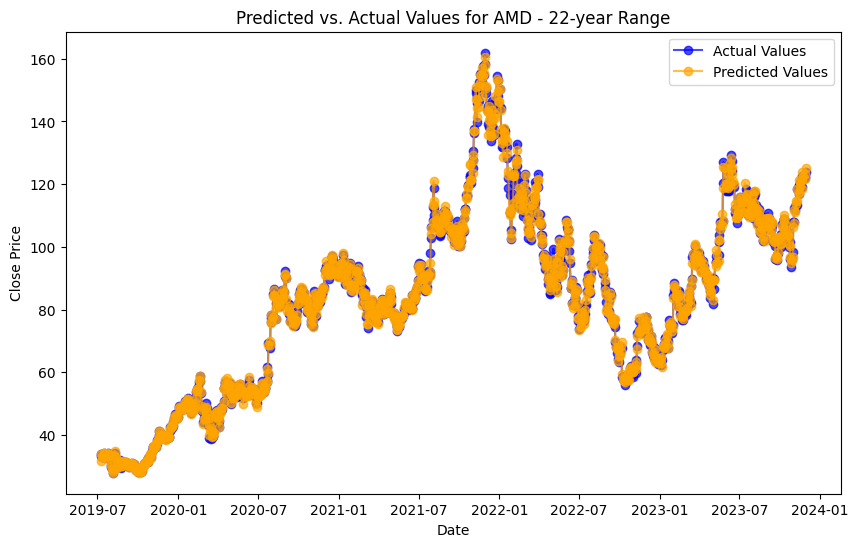


AMD - 22-year Range - Decision Trees Evaluation:
  MSE: 2588.346300293522
  MAE: 42.91463855371578
  RMSE: 50.87579287139928
  MAPE: 44.754402492267324
  R2 Score: -2.128187471474567


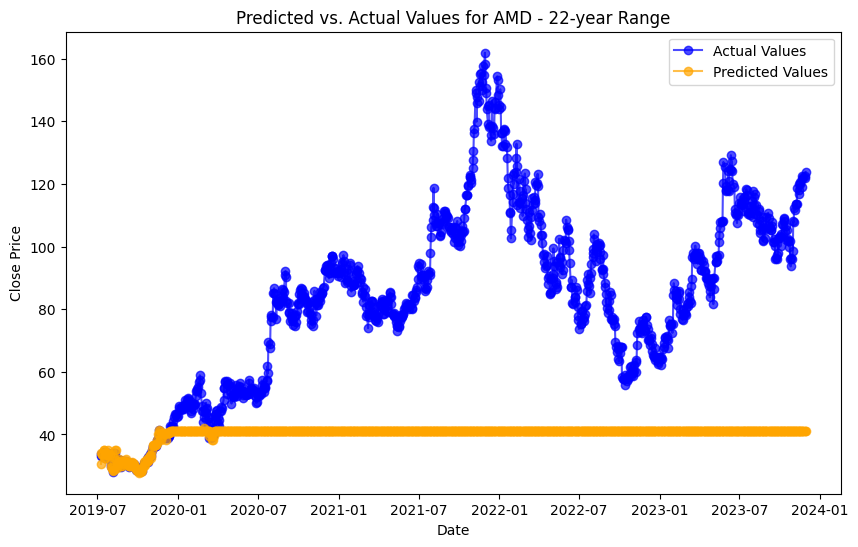

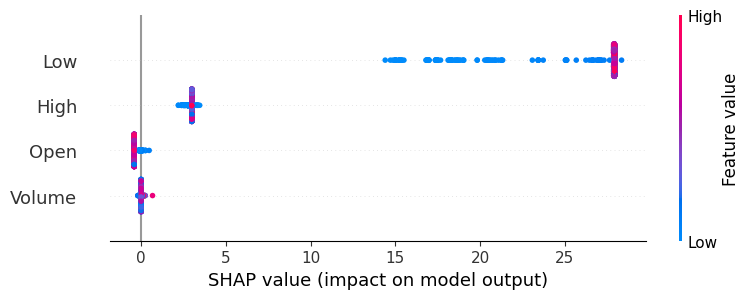

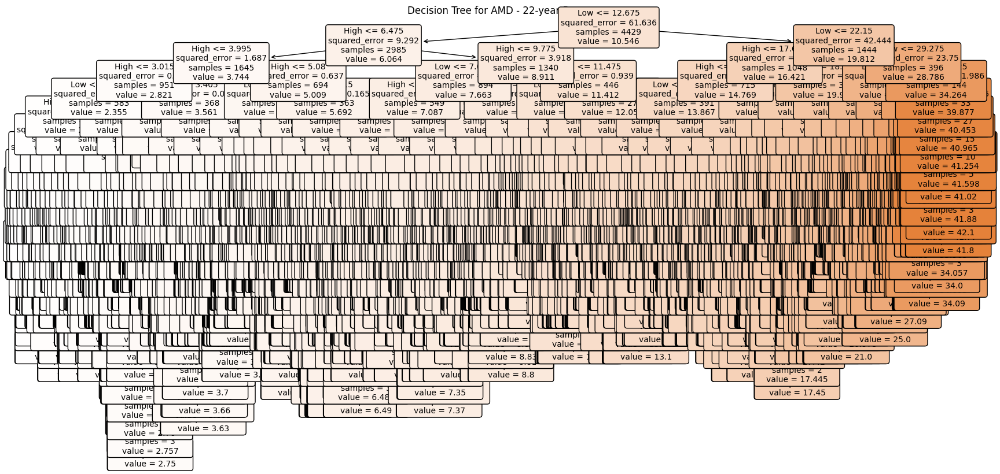

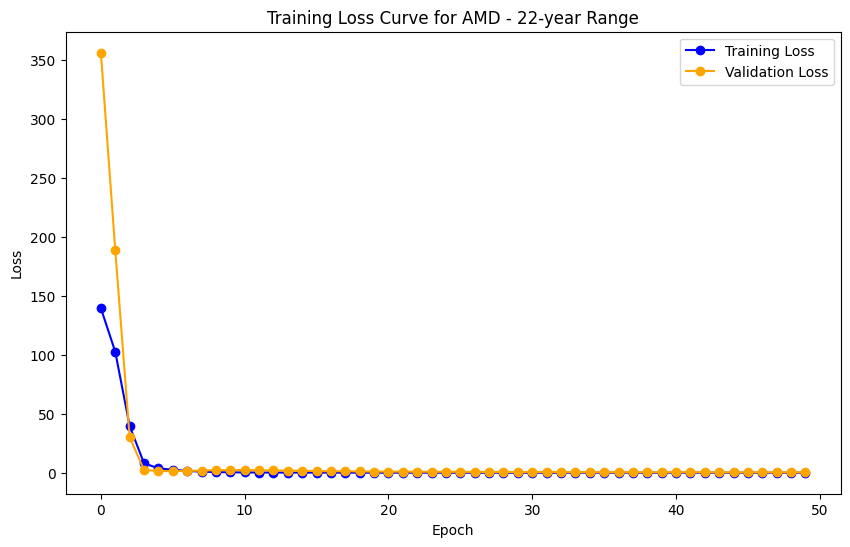

35/35 [==============================] - 0s 2ms/step

AMD - 22-year Range - LSTM Evaluation:
  MSE: 16.193317522909066
  MAE: 2.9481592591488837
  RMSE: 4.02409213648359
  MAPE: 46.62244238292071
  R2 Score: 0.980429306159292


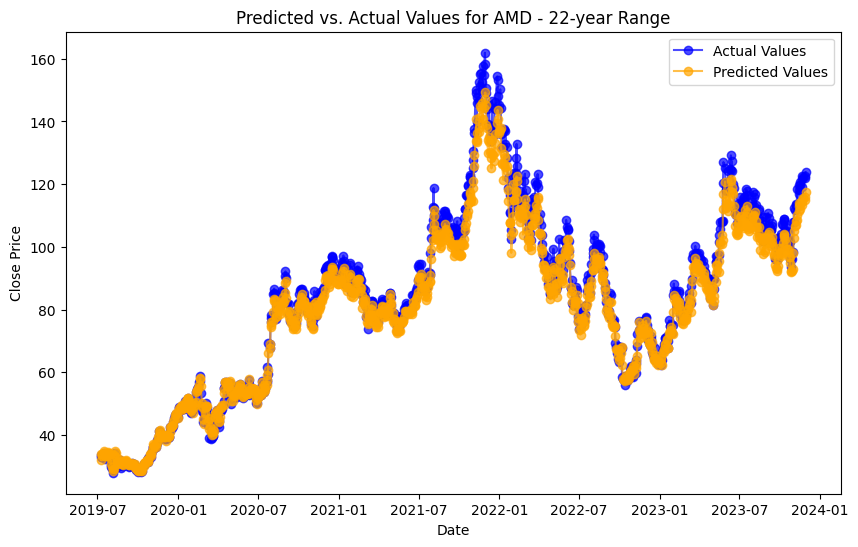


ELECTRONIC ARTS - 1-year Range - Linear Regression Evaluation:
  MSE: 0.2562538393712871
  MAE: 0.4181059729736539
  RMSE: 0.5062152105293628
  MAPE: 0.32760479311127566
  R2 Score: 0.9928750909779259


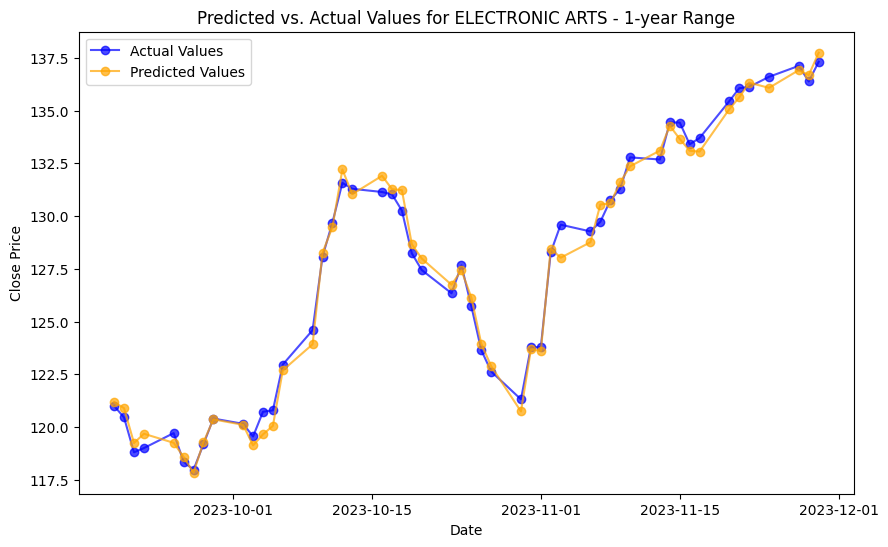


ELECTRONIC ARTS - 1-year Range - Decision Trees Evaluation:
  MSE: 4.6113019075425
  MAE: 1.510587355669807
  RMSE: 2.1473942133531283
  MAPE: 1.159336551369271
  R2 Score: 0.8717868709980451


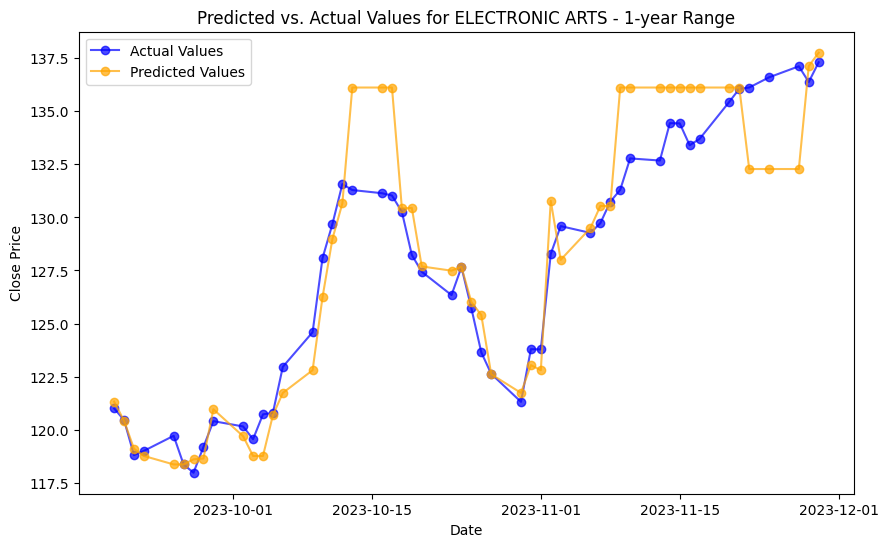

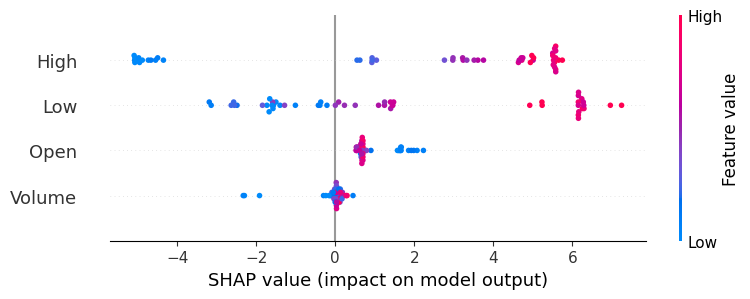

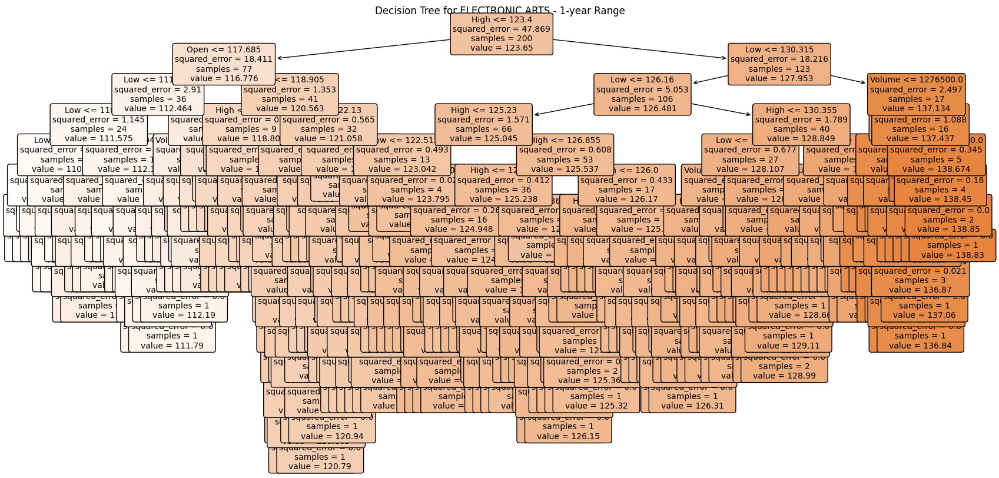

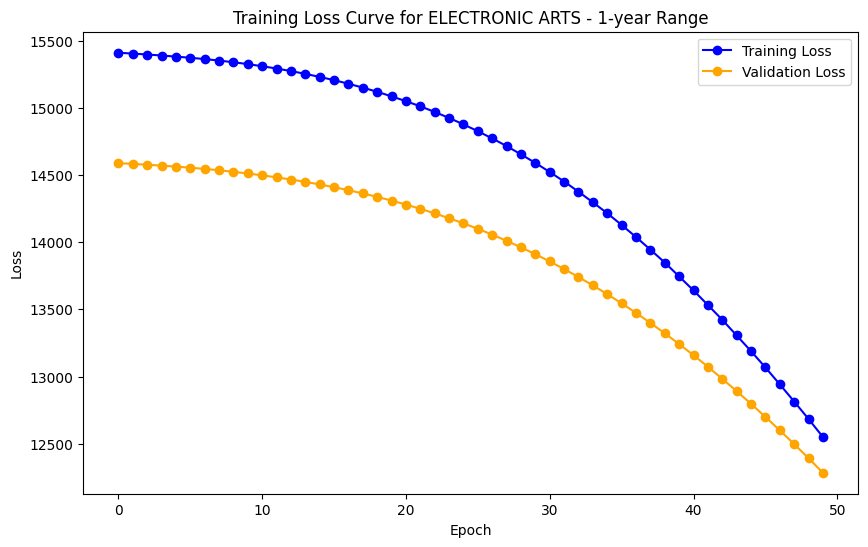

2/2 [==============================] - 0s 6ms/step

ELECTRONIC ARTS - 1-year Range - LSTM Evaluation:
  MSE: 12754.262493409416
  MAE: 112.92212310491824
  RMSE: 112.93477096718006
  MAPE: 88.5394494963137
  R2 Score: -353.62087175805357


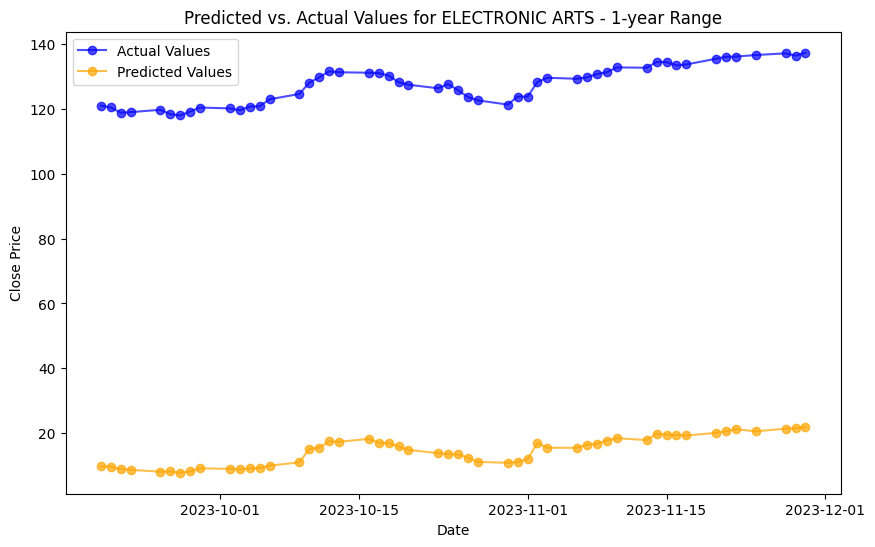


ELECTRONIC ARTS - 3-year Range - Linear Regression Evaluation:
  MSE: 0.2839302773301678
  MAE: 0.4373265230227174
  RMSE: 0.532851083634225
  MAPE: 0.3434452670832979
  R2 Score: 0.9913280812468072


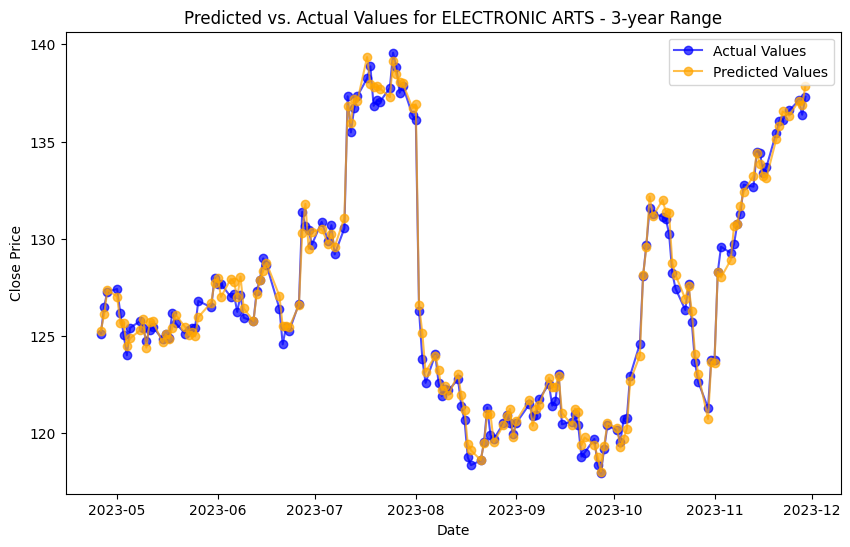


ELECTRONIC ARTS - 3-year Range - Decision Trees Evaluation:
  MSE: 1.0299012752921346
  MAE: 0.7954300128860979
  RMSE: 1.0148405171711143
  MAPE: 0.6263505760556445
  R2 Score: 0.9685443191648159


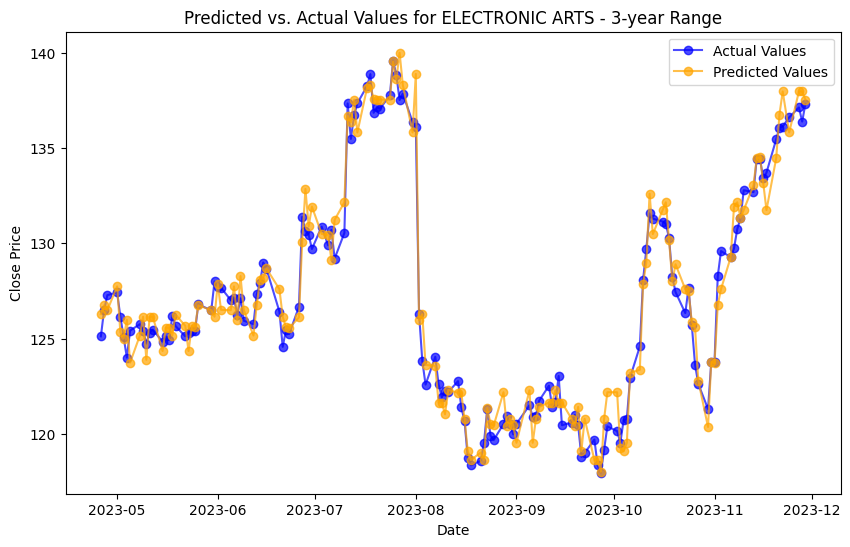

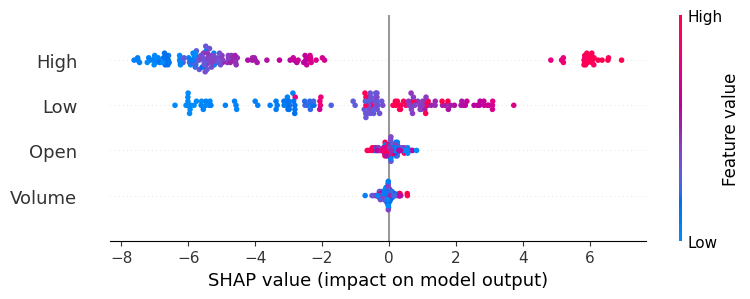

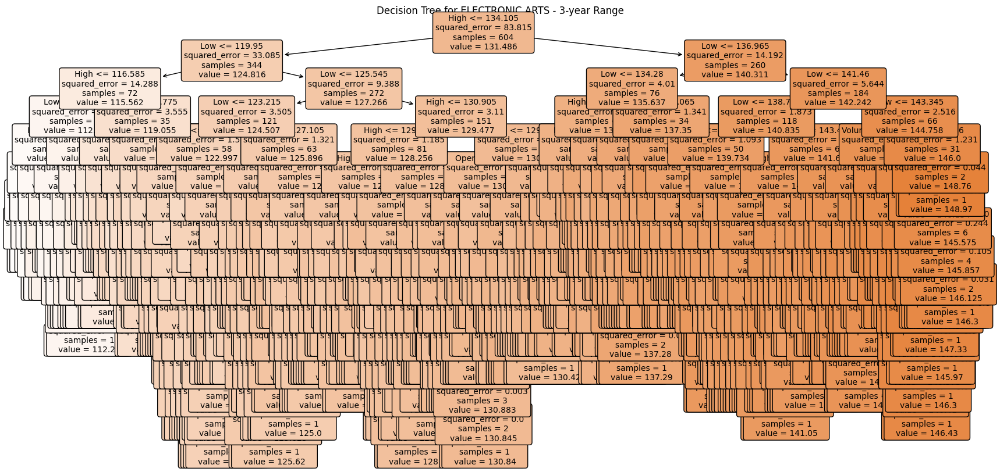

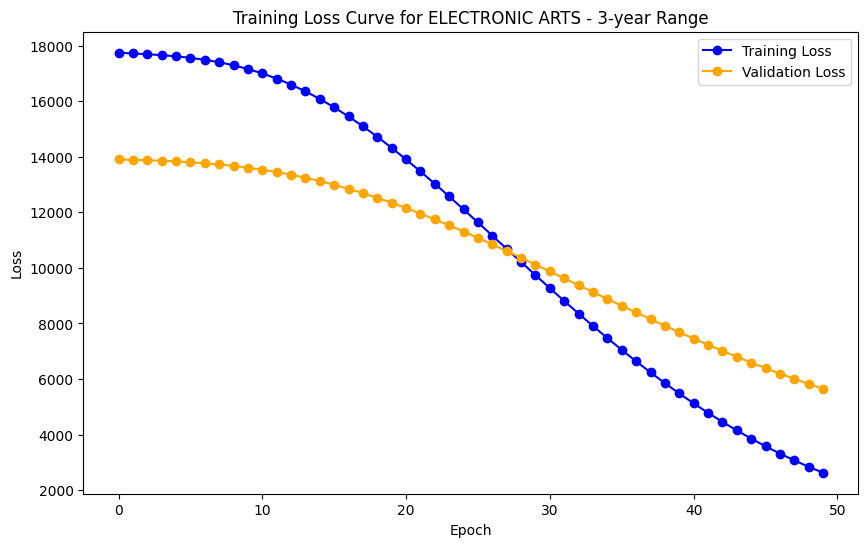

5/5 [==============================] - 0s 3ms/step

ELECTRONIC ARTS - 3-year Range - LSTM Evaluation:
  MSE: 3591.9850645303163
  MAE: 59.04371481383873
  RMSE: 59.9331716541876
  MAPE: 46.38226244971378
  R2 Score: -108.70792877459478


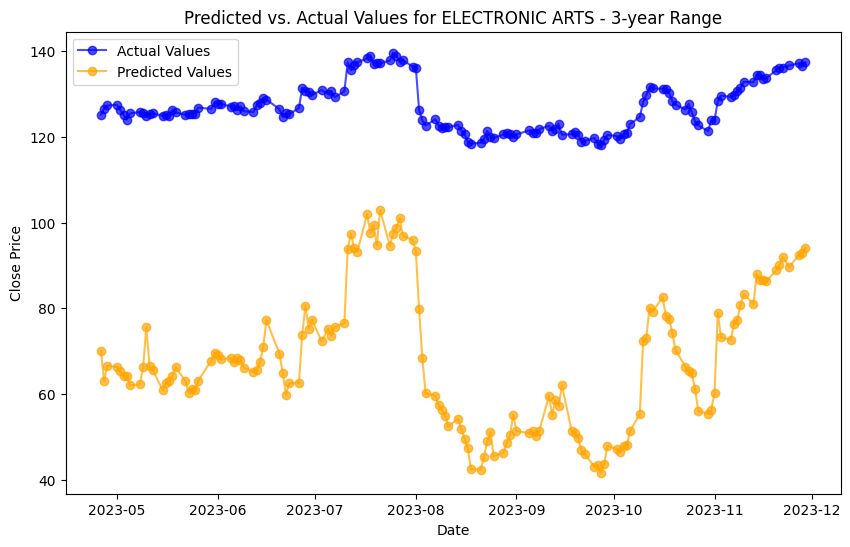


ELECTRONIC ARTS - 5-year Range - Linear Regression Evaluation:
  MSE: 0.3107187634614752
  MAE: 0.4340325034443165
  RMSE: 0.5574215312144618
  MAPE: 0.348292088769391
  R2 Score: 0.99348632432078


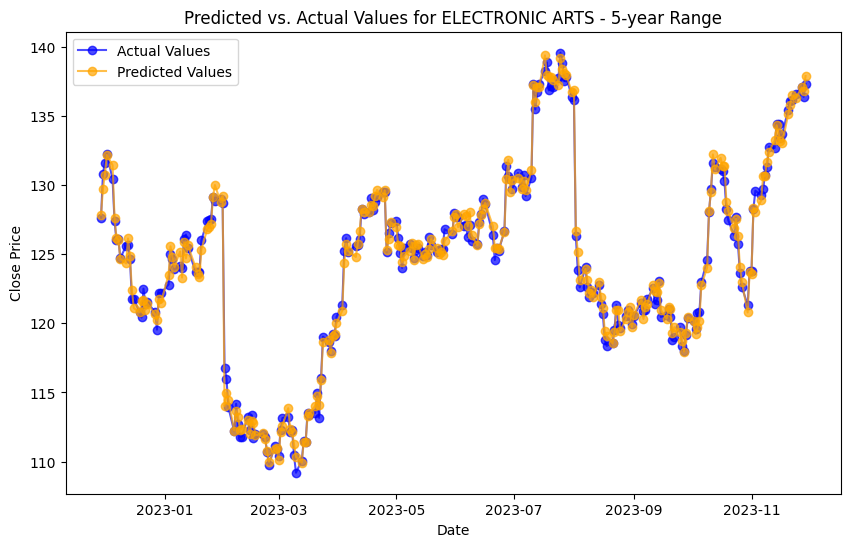


ELECTRONIC ARTS - 5-year Range - Decision Trees Evaluation:
  MSE: 1.1478256276868273
  MAE: 0.8395634303017269
  RMSE: 1.0713662434885782
  MAPE: 0.6831937660079188
  R2 Score: 0.9759378423376863


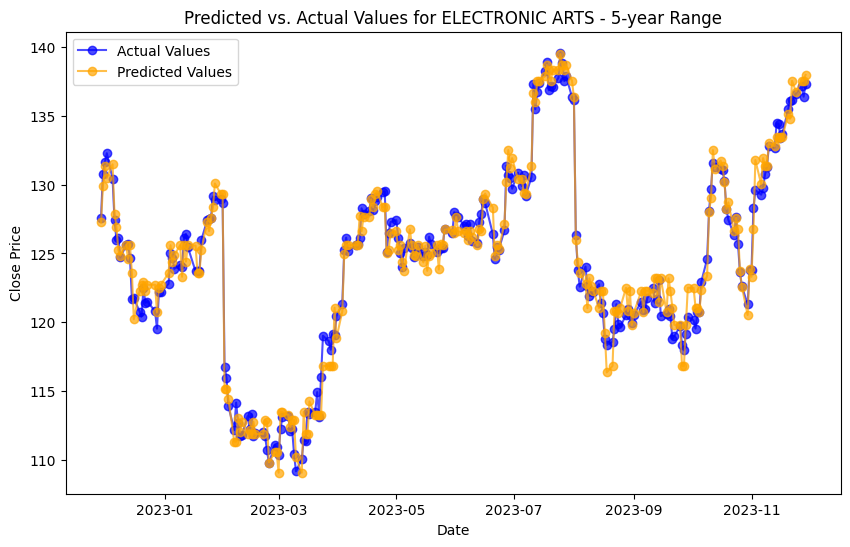

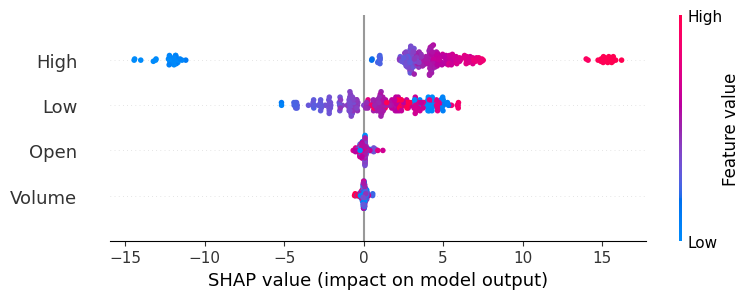

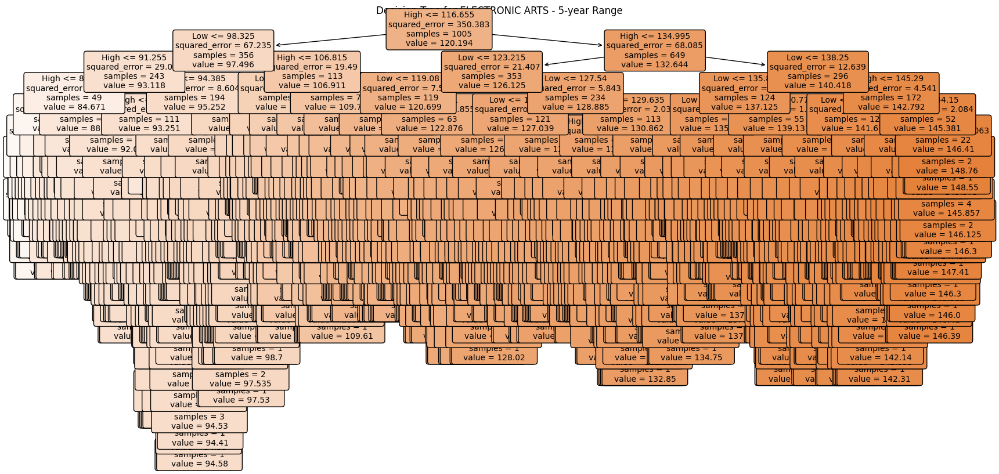

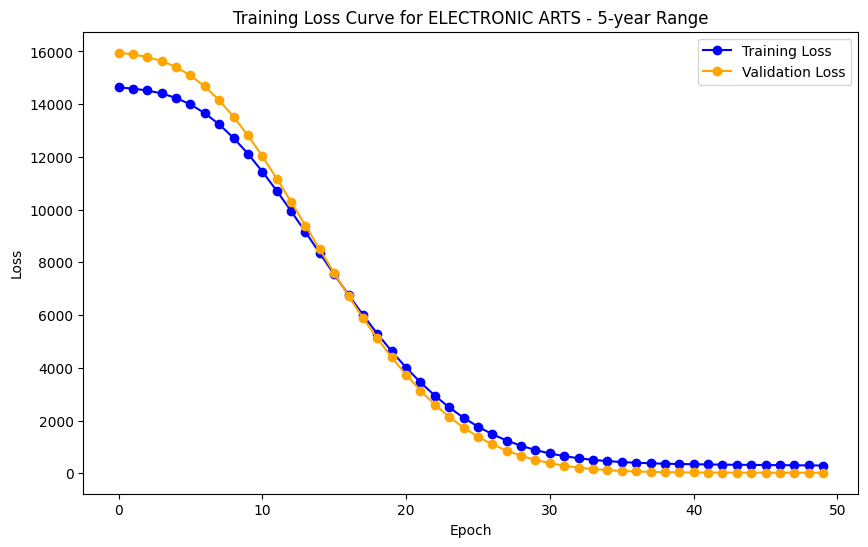

8/8 [==============================] - 0s 3ms/step

ELECTRONIC ARTS - 5-year Range - LSTM Evaluation:
  MSE: 38.65039180931617
  MAE: 4.819200001065693
  RMSE: 6.216943928435914
  MAPE: 9.218257757857943
  R2 Score: 0.18976210410967842


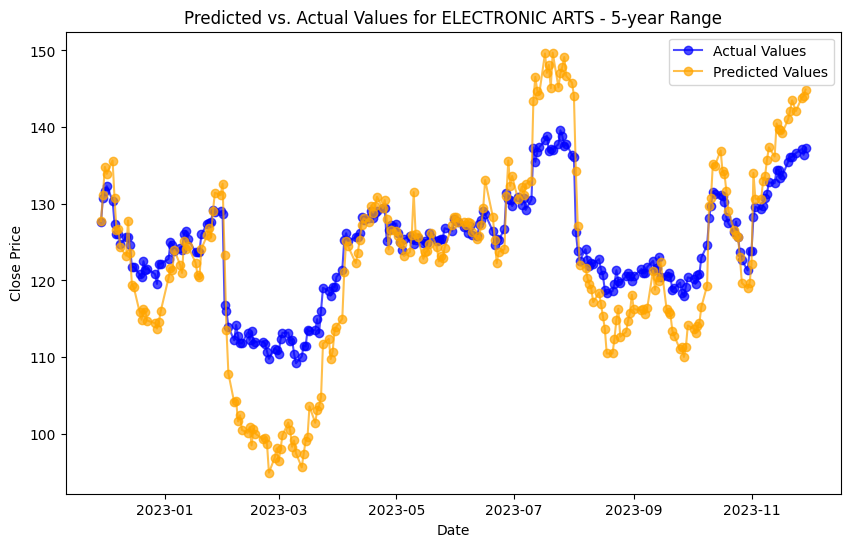


ELECTRONIC ARTS - 10-year Range - Linear Regression Evaluation:
  MSE: 0.5792251925079739
  MAE: 0.5791725155809243
  RMSE: 0.7610684545479295
  MAPE: 0.45731824100448076
  R2 Score: 0.9860327560575474


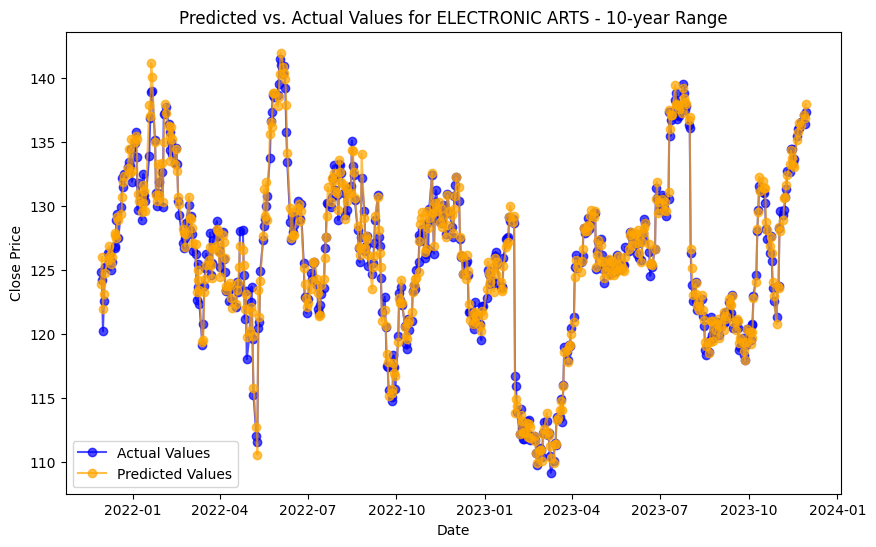


ELECTRONIC ARTS - 10-year Range - Decision Trees Evaluation:
  MSE: 1.5187881124787501
  MAE: 0.9446029057578434
  RMSE: 1.232391217300233
  MAPE: 0.7476320991578865
  R2 Score: 0.9633764478163717


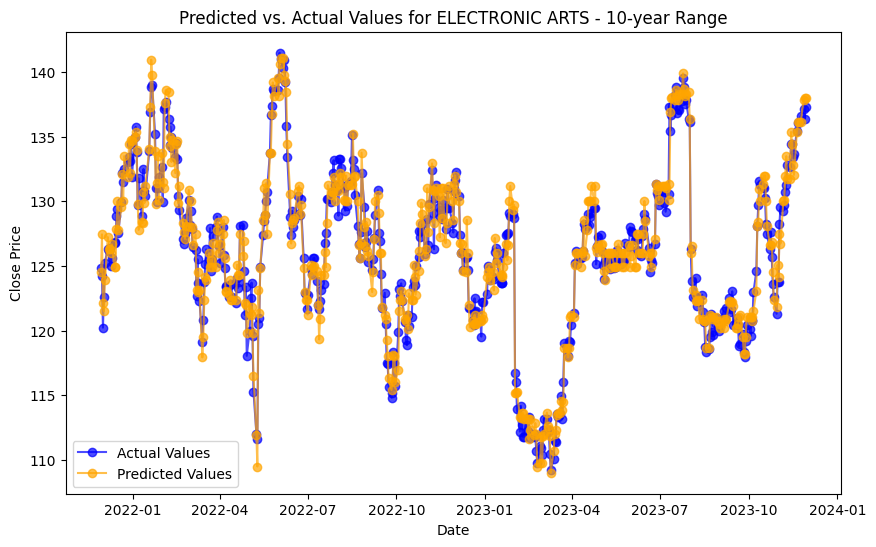

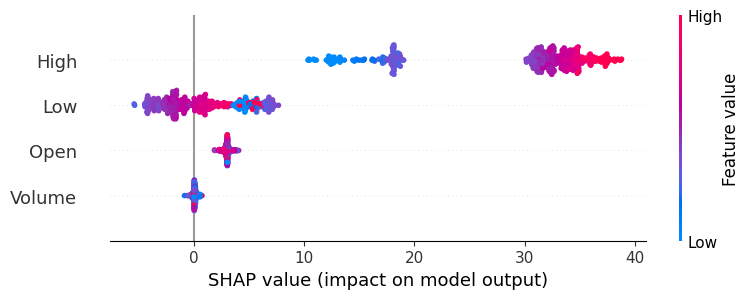

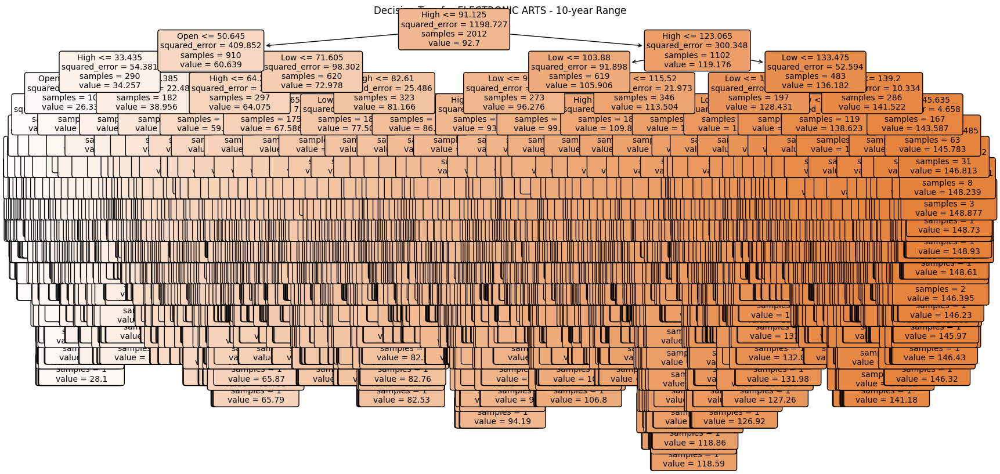

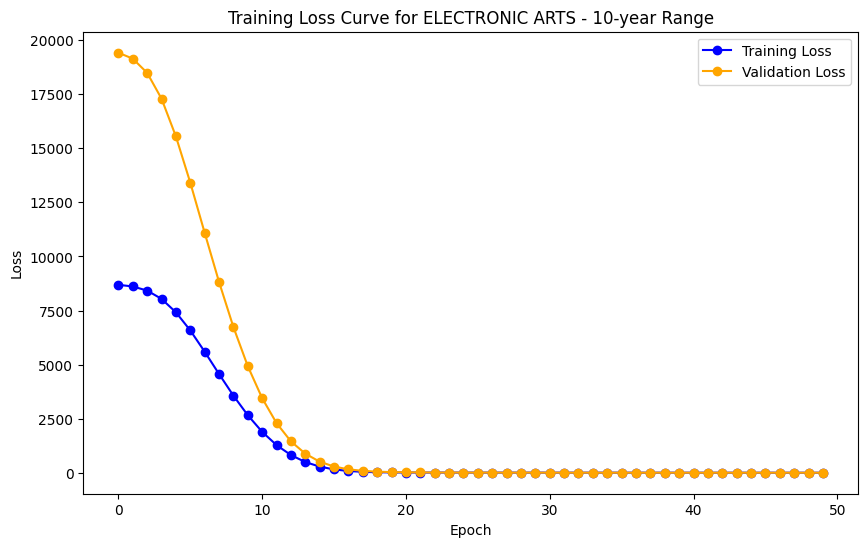

16/16 [==============================] - 0s 3ms/step

ELECTRONIC ARTS - 10-year Range - LSTM Evaluation:
  MSE: 1.4756922180538476
  MAE: 0.9339444296700614
  RMSE: 1.2147807283842824
  MAPE: 5.675853693050394
  R2 Score: 0.9644156479032058


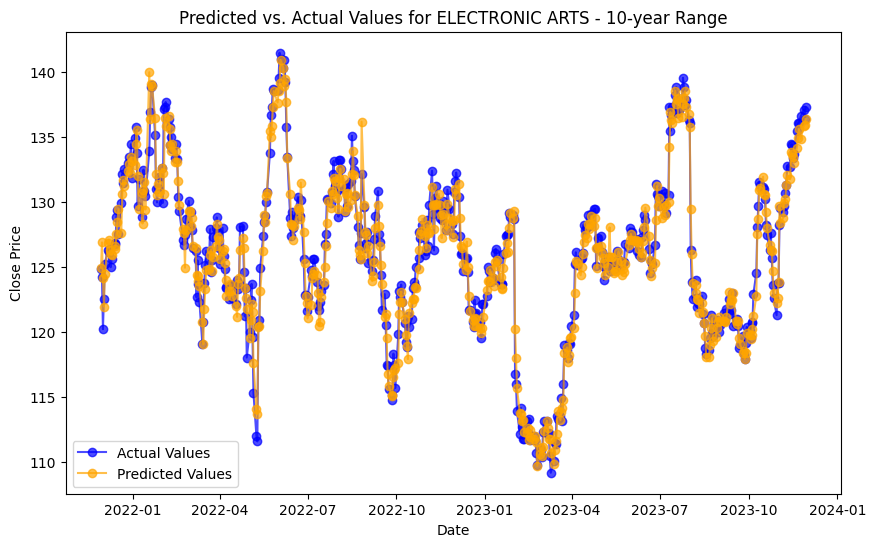


ELECTRONIC ARTS - 22-year Range - Linear Regression Evaluation:
  MSE: 0.7020210530916694
  MAE: 0.6310857537752476
  RMSE: 0.8378669662253486
  MAPE: 0.5134179351077026
  R2 Score: 0.9966085168248576


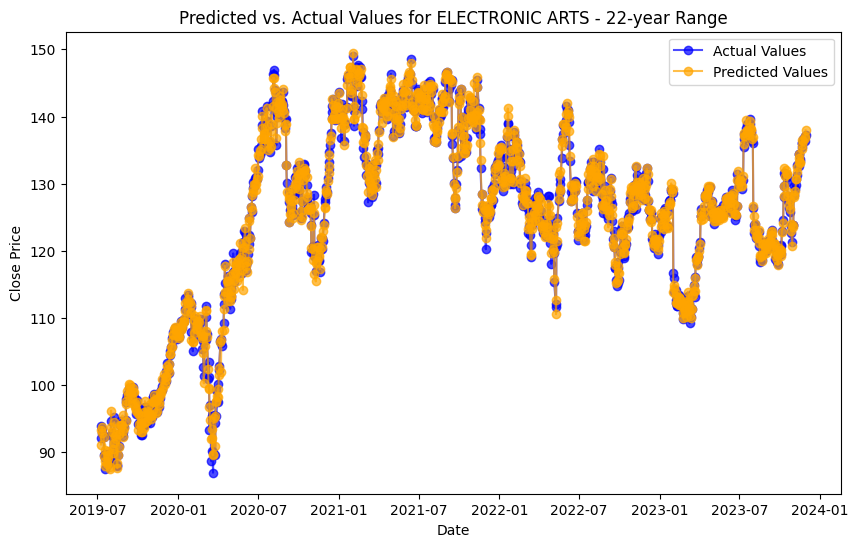


ELECTRONIC ARTS - 22-year Range - Decision Trees Evaluation:
  MSE: 1.9008555136552074
  MAE: 1.0304601097795507
  RMSE: 1.378715167703325
  MAPE: 0.8378899285168974
  R2 Score: 0.9908169143011492


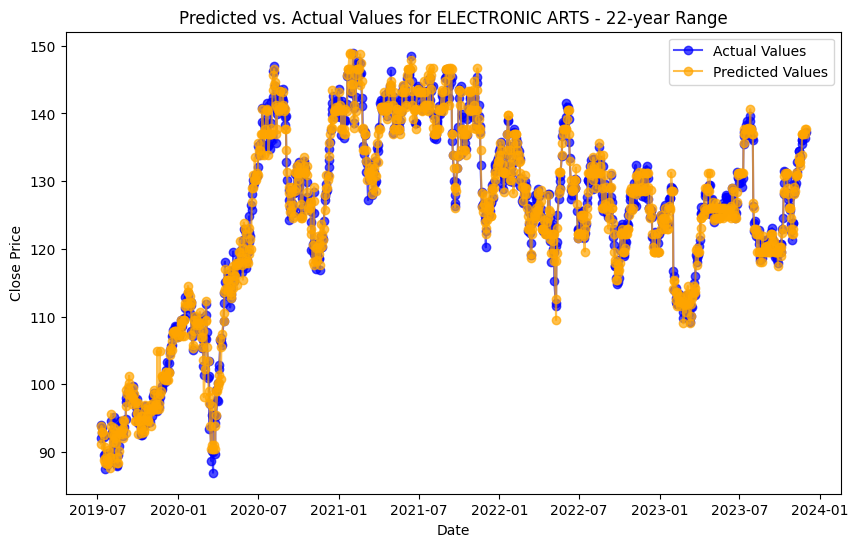

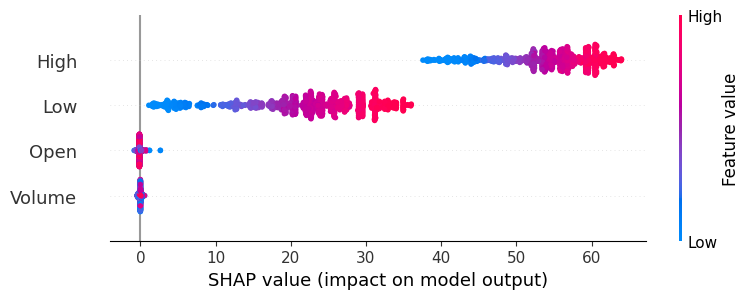

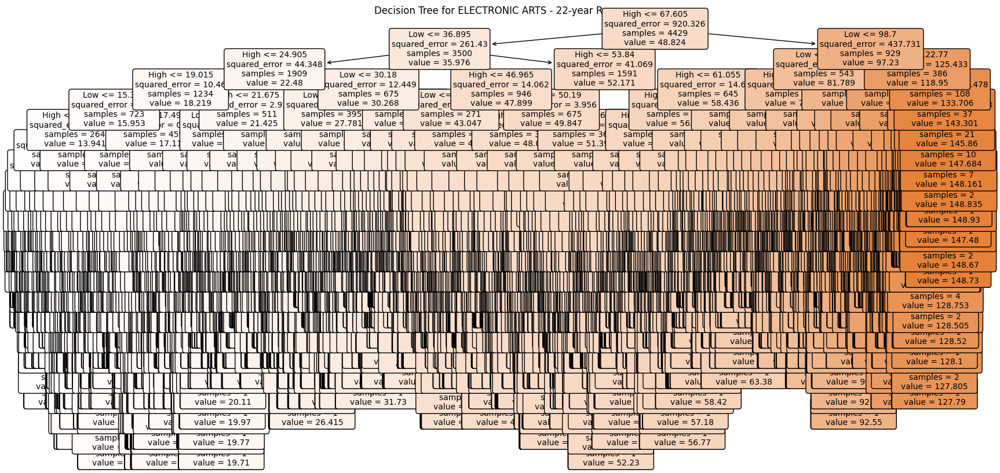

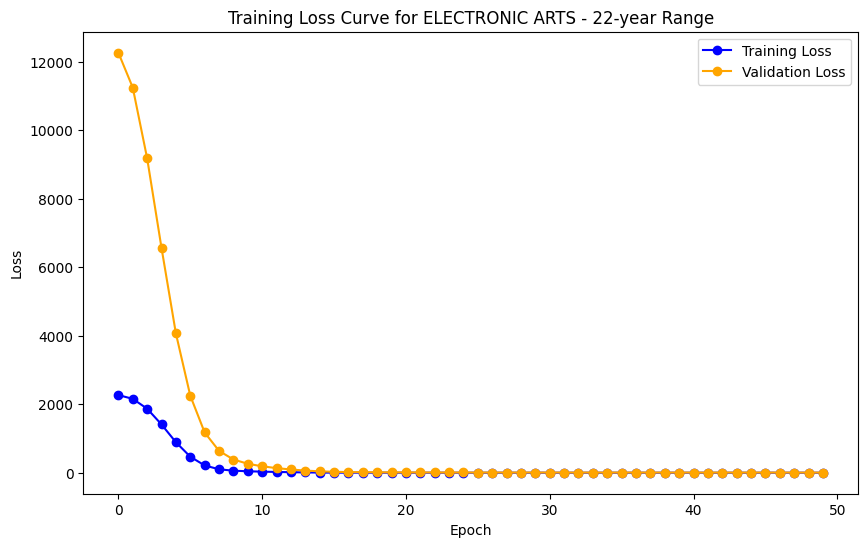

35/35 [==============================] - 0s 3ms/step

ELECTRONIC ARTS - 22-year Range - LSTM Evaluation:
  MSE: 9.220575048204823
  MAE: 2.581562358980144
  RMSE: 3.0365399796816153
  MAPE: 12.768249793695826
  R2 Score: 0.9554551462475284


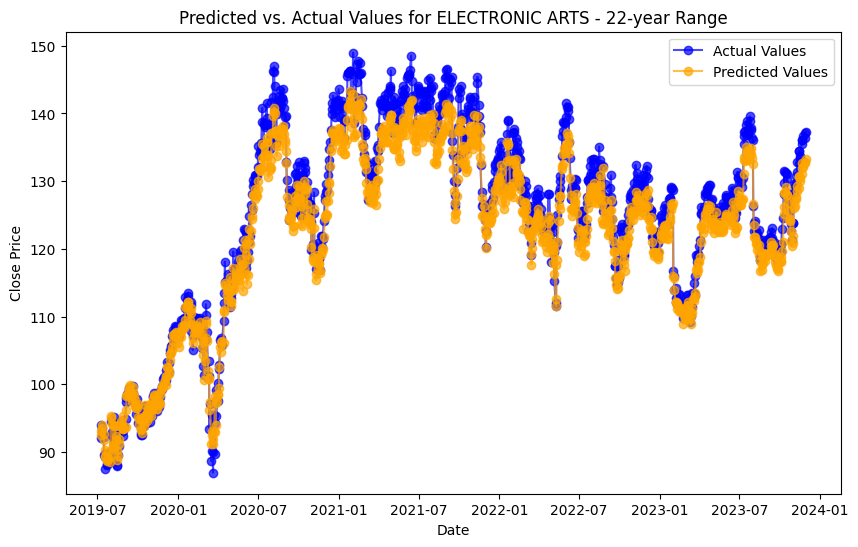


APPLE - 1-year Range - Linear Regression Evaluation:
  MSE: 0.5237545507101815
  MAE: 0.603969935612132
  RMSE: 0.7237088853331715
  MAPE: 0.34002189113315845
  R2 Score: 0.9892766840309676


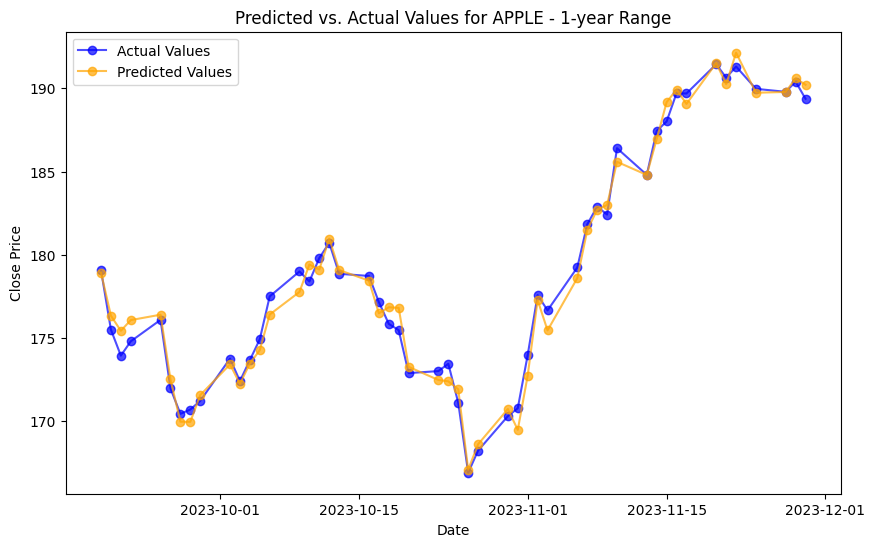


APPLE - 1-year Range - Decision Trees Evaluation:
  MSE: 1.6261830305927159
  MAE: 0.9937244490081188
  RMSE: 1.2752188167497827
  MAPE: 0.5639478962920597
  R2 Score: 0.9667056363770408


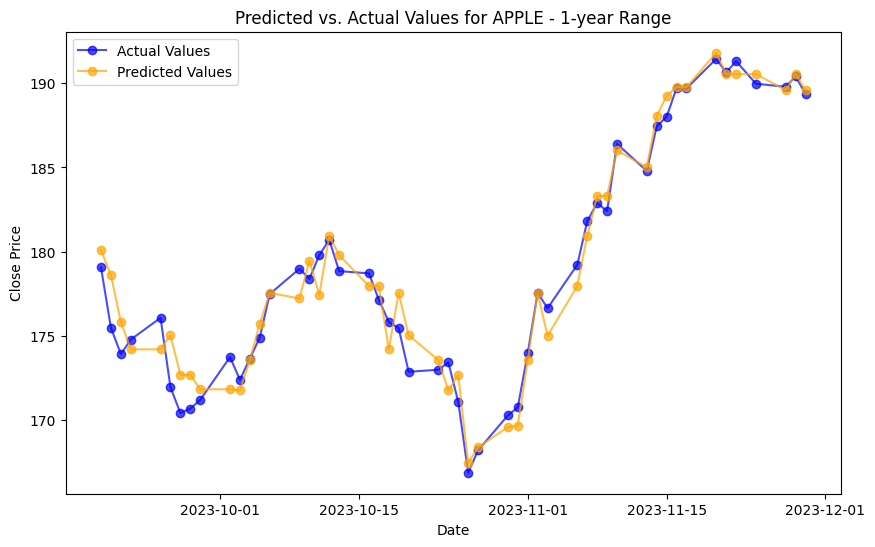

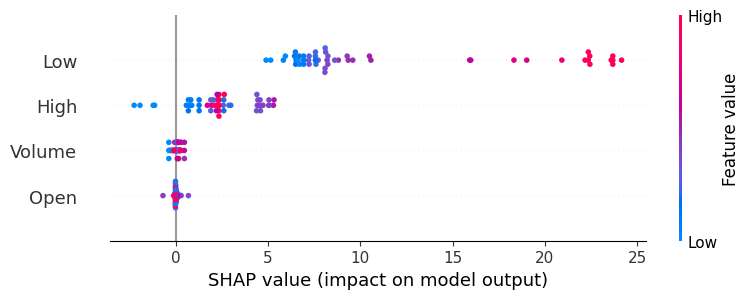

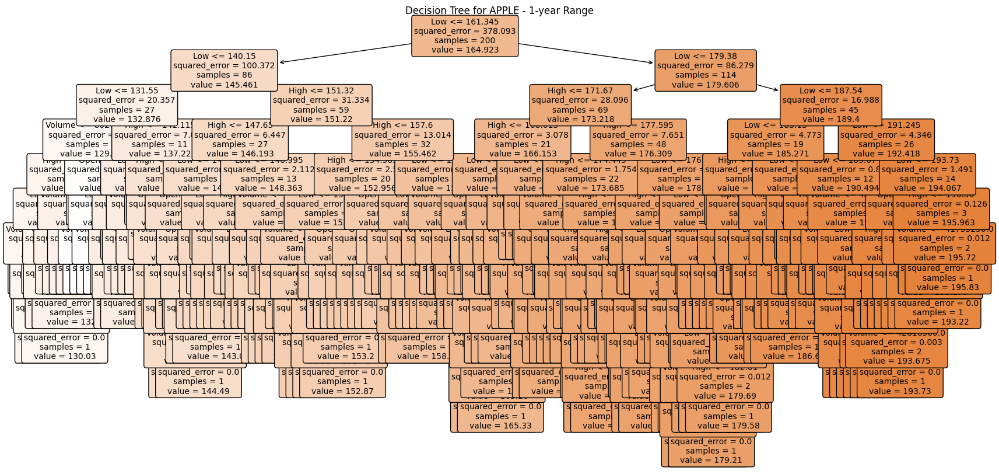

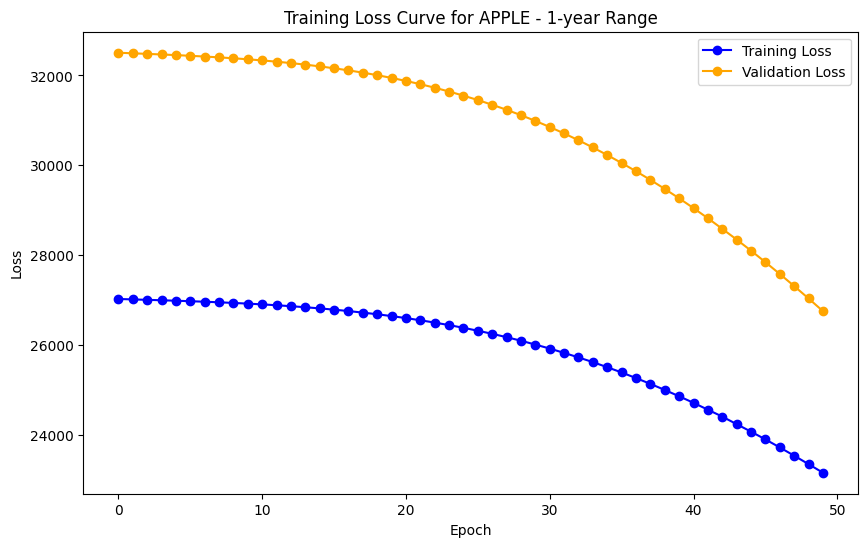

2/2 [==============================] - 0s 6ms/step

APPLE - 1-year Range - LSTM Evaluation:
  MSE: 26622.196168629718
  MAE: 163.080348332723
  RMSE: 163.1630968345162
  MAPE: 91.18419868389167
  R2 Score: -544.0610804597083


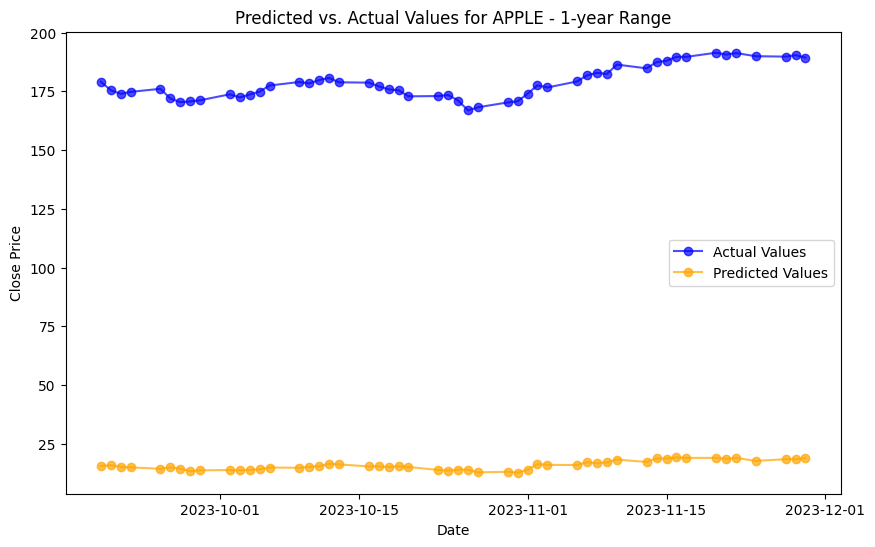


APPLE - 3-year Range - Linear Regression Evaluation:
  MSE: 0.5402336881804054
  MAE: 0.5982887347121819
  RMSE: 0.7350059103030433
  MAPE: 0.3325173087050506
  R2 Score: 0.9912874703510189


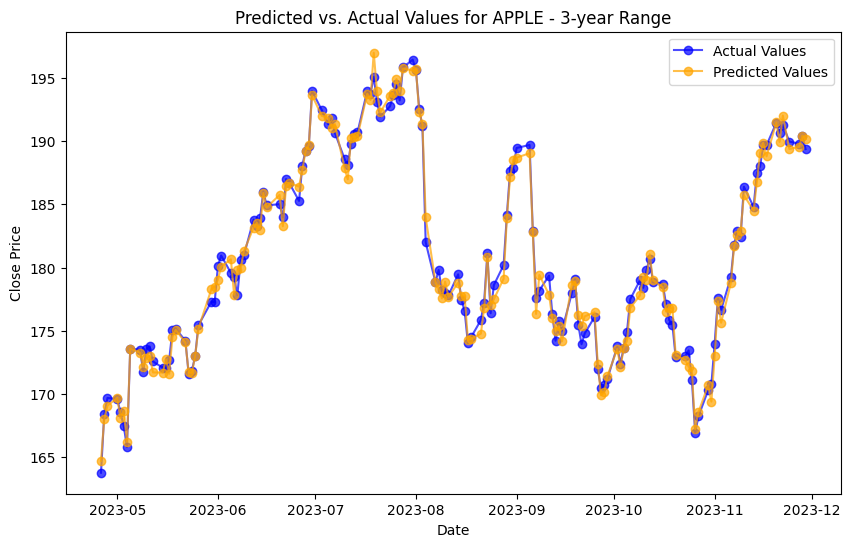


APPLE - 3-year Range - Decision Trees Evaluation:
  MSE: 42.49863253686337
  MAE: 4.453047291332523
  RMSE: 6.51909752472406
  MAPE: 2.3674709078777676
  R2 Score: 0.31461031749852075


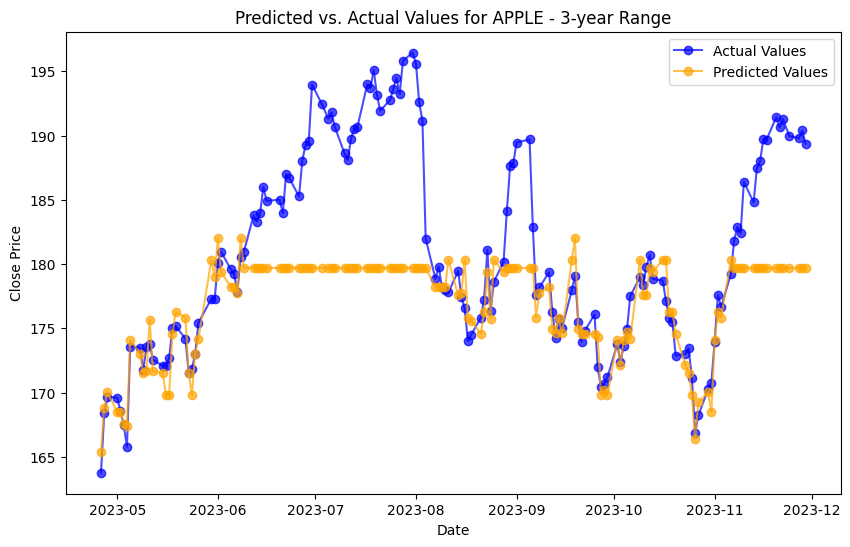

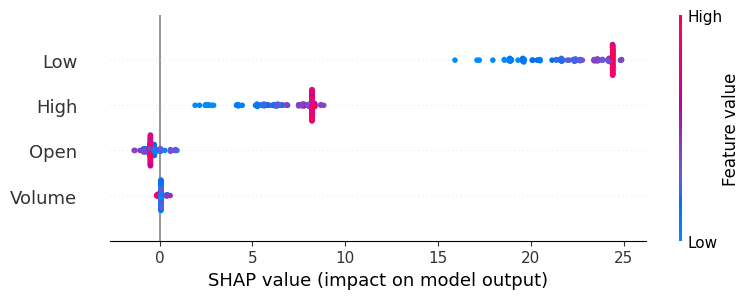

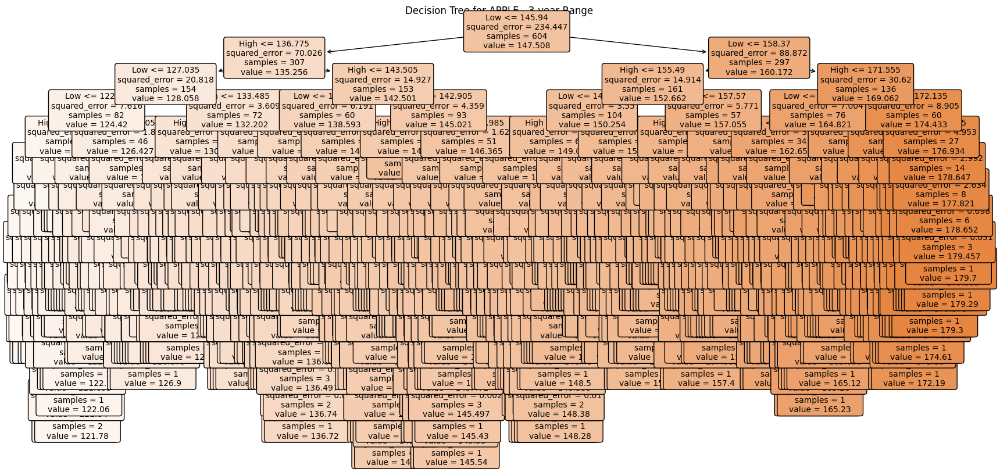

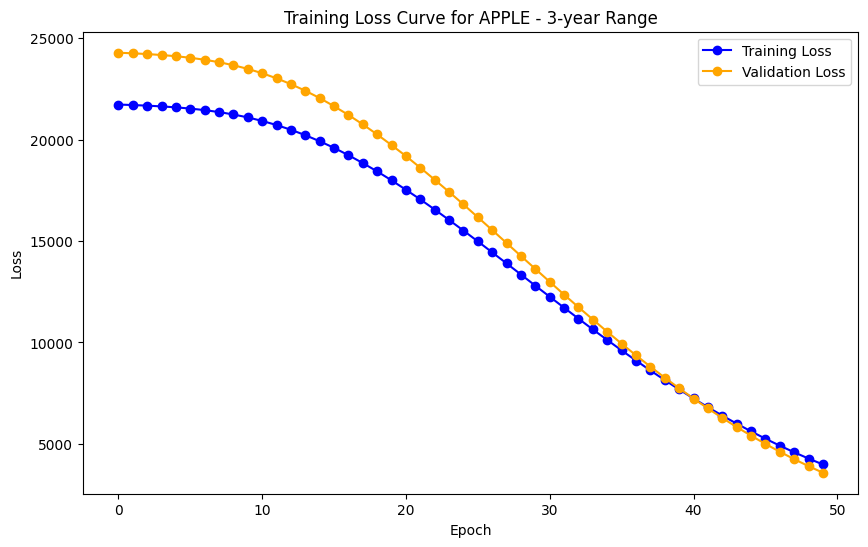

5/5 [==============================] - 0s 5ms/step

APPLE - 3-year Range - LSTM Evaluation:
  MSE: 1758.527255376675
  MAE: 41.406608480491386
  RMSE: 41.93479766705301
  MAPE: 22.775575787875894
  R2 Score: -27.360358093577688


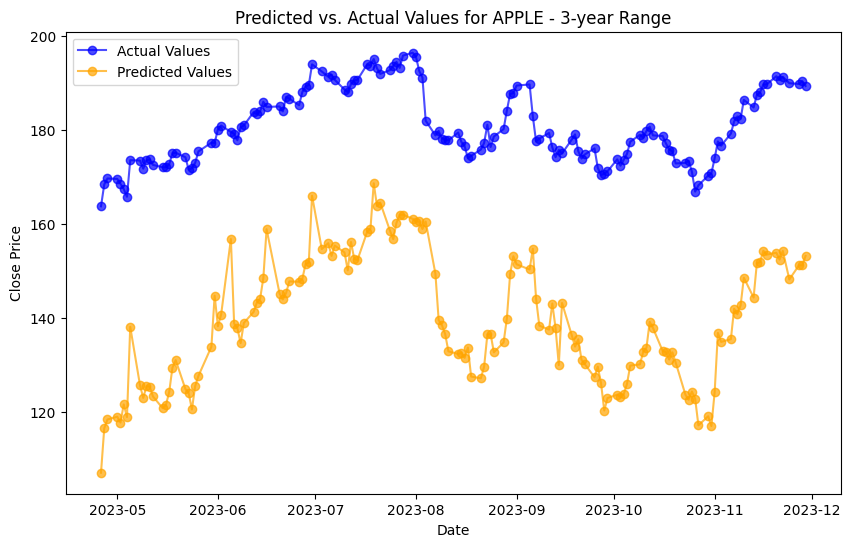


APPLE - 5-year Range - Linear Regression Evaluation:
  MSE: 0.69542690097673
  MAE: 0.670298268621915
  RMSE: 0.8339225989123511
  MAPE: 0.4130989456992867
  R2 Score: 0.9979778050153996


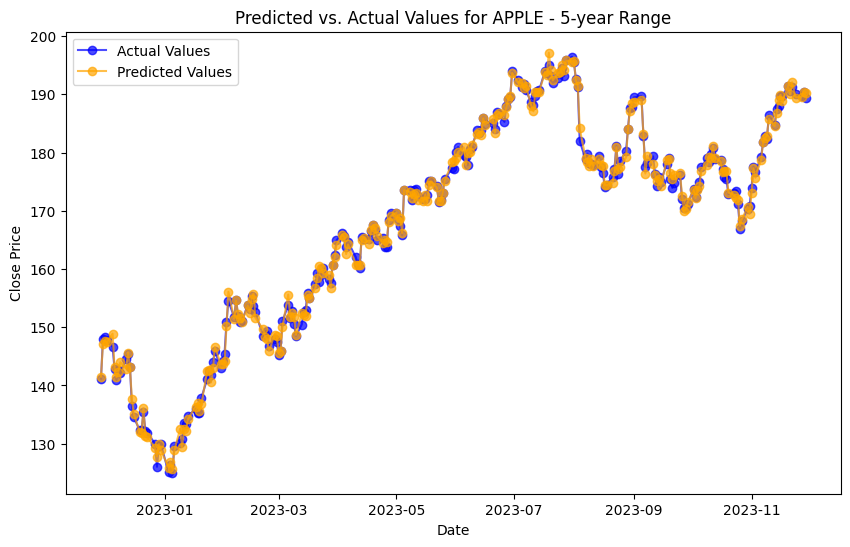


APPLE - 5-year Range - Decision Trees Evaluation:
  MSE: 27.465430801240025
  MAE: 3.1055838569762213
  RMSE: 5.240747160590751
  MAPE: 1.7087721671870009
  R2 Score: 0.9201347311440625


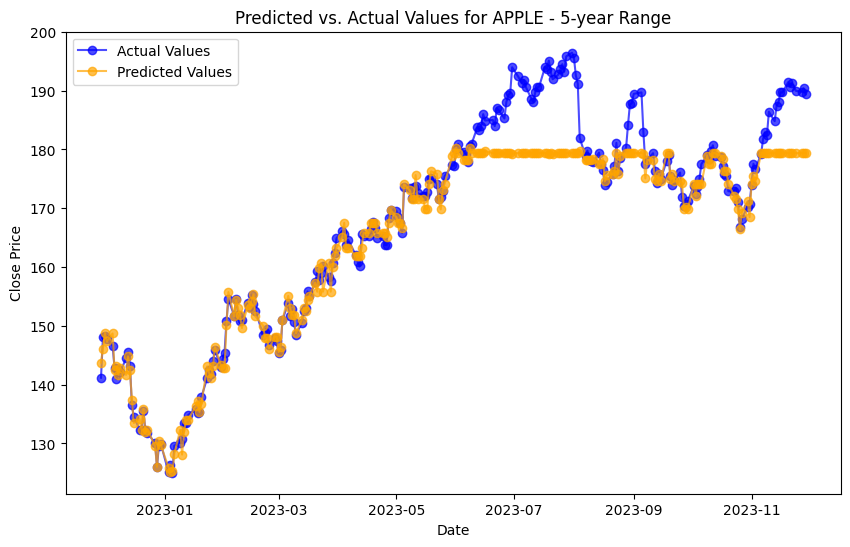

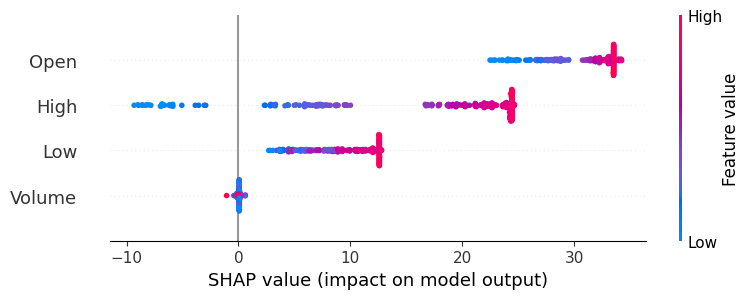

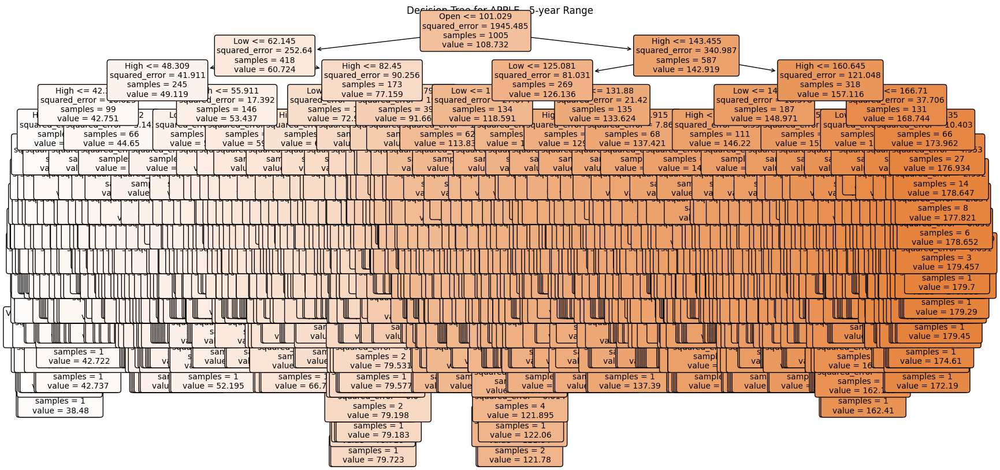

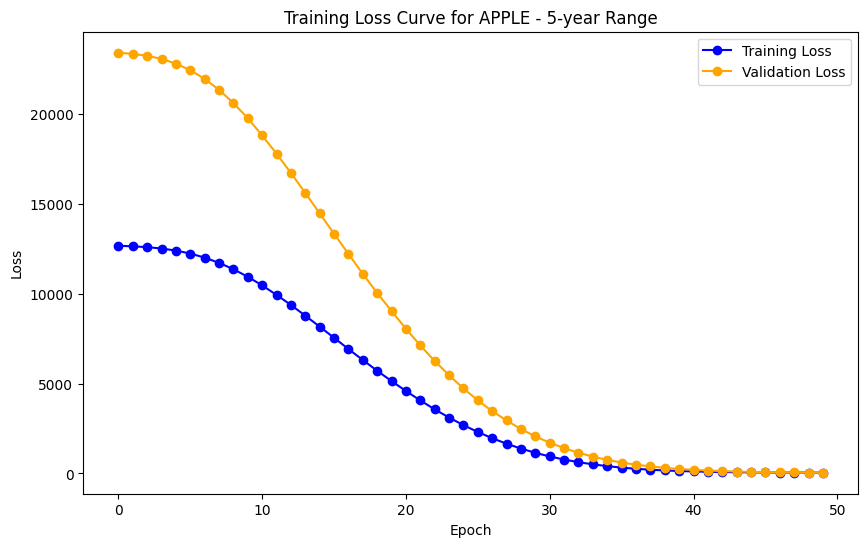

8/8 [==============================] - 0s 3ms/step

APPLE - 5-year Range - LSTM Evaluation:
  MSE: 85.8327782980334
  MAE: 8.841730662754603
  RMSE: 9.264598118538839
  MAPE: 12.878020340277763
  R2 Score: 0.7504114184469658


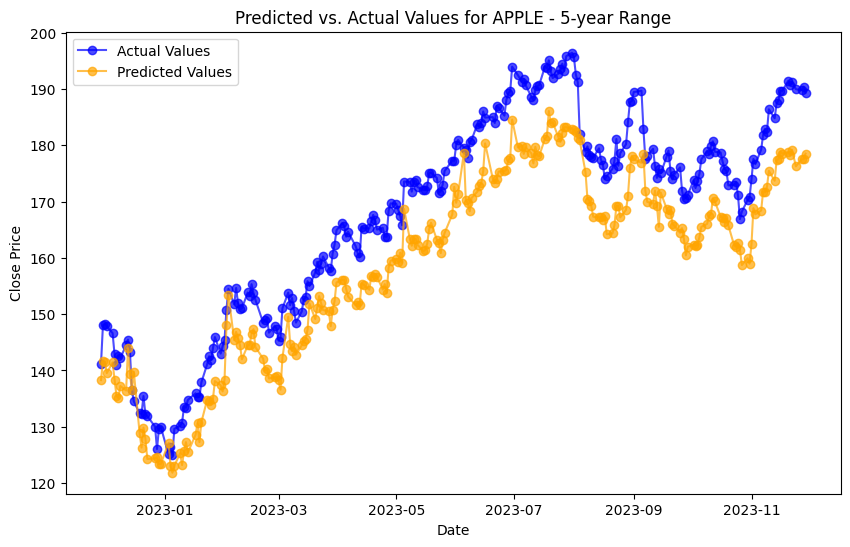


APPLE - 10-year Range - Linear Regression Evaluation:
  MSE: 1.0798558036414243
  MAE: 0.8274459055653846
  RMSE: 1.0391611057201016
  MAPE: 0.5199740390066275
  R2 Score: 0.9961015752194018


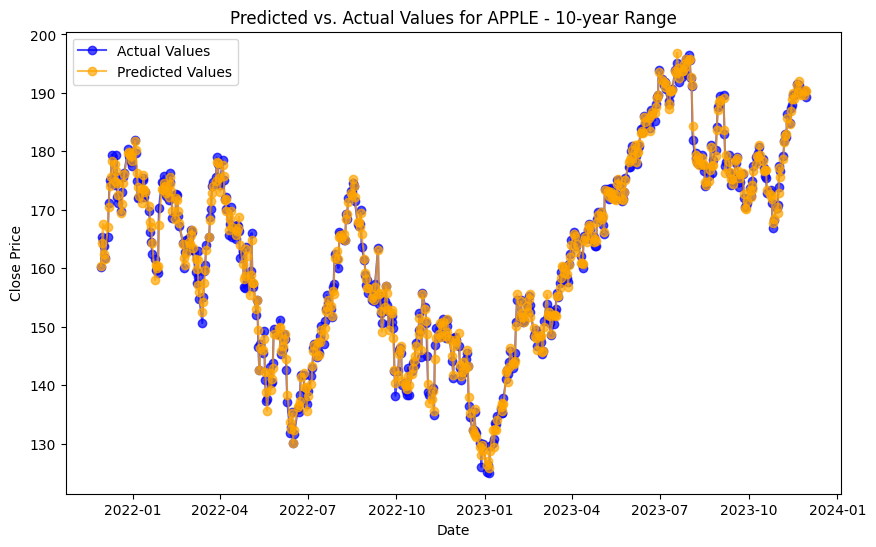


APPLE - 10-year Range - Decision Trees Evaluation:
  MSE: 155.88447723584966
  MAE: 8.539357957385835
  RMSE: 12.485370528576622
  MAPE: 4.812214418293786
  R2 Score: 0.43723605789071596


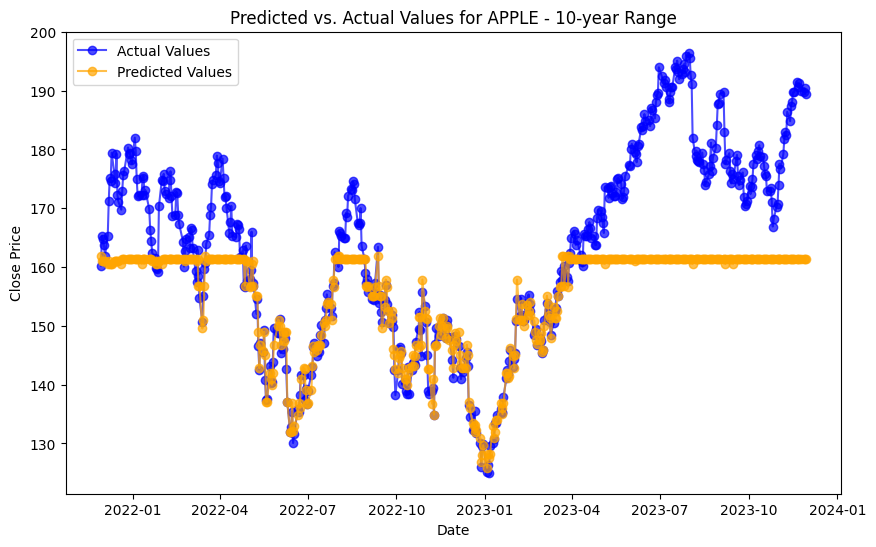

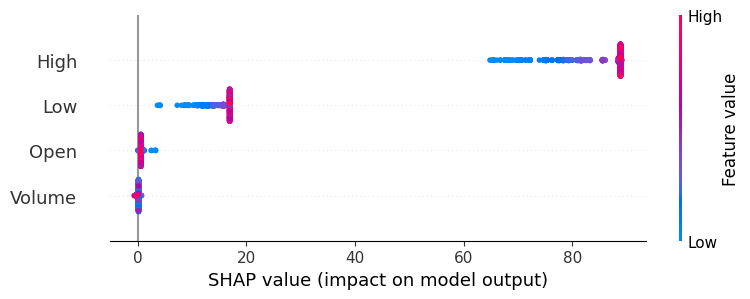

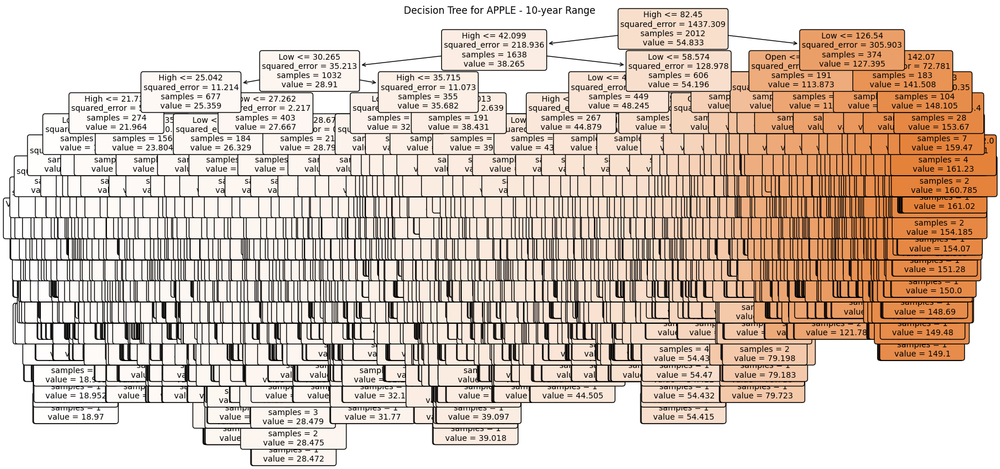

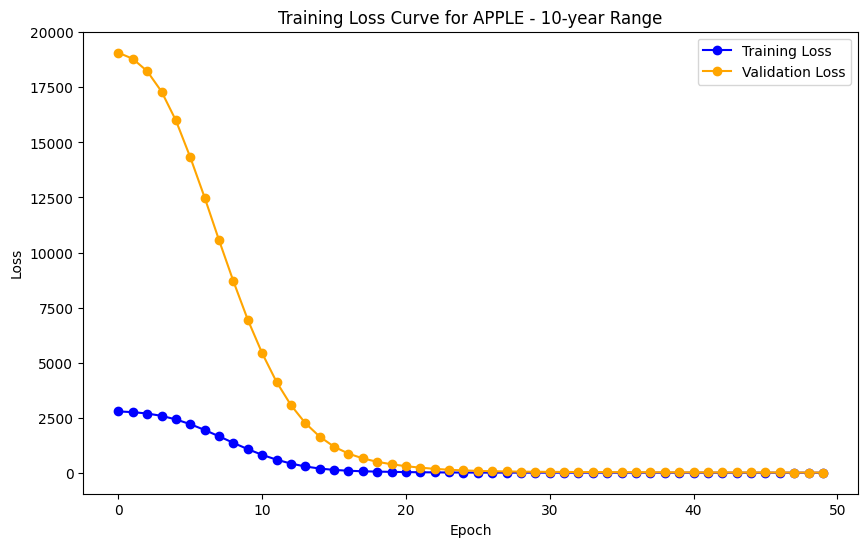

16/16 [==============================] - 0s 3ms/step

APPLE - 10-year Range - LSTM Evaluation:
  MSE: 38.93022433143732
  MAE: 5.607426219516331
  RMSE: 6.239408972926628
  MAPE: 11.304040771277283
  R2 Score: 0.8594566508452838


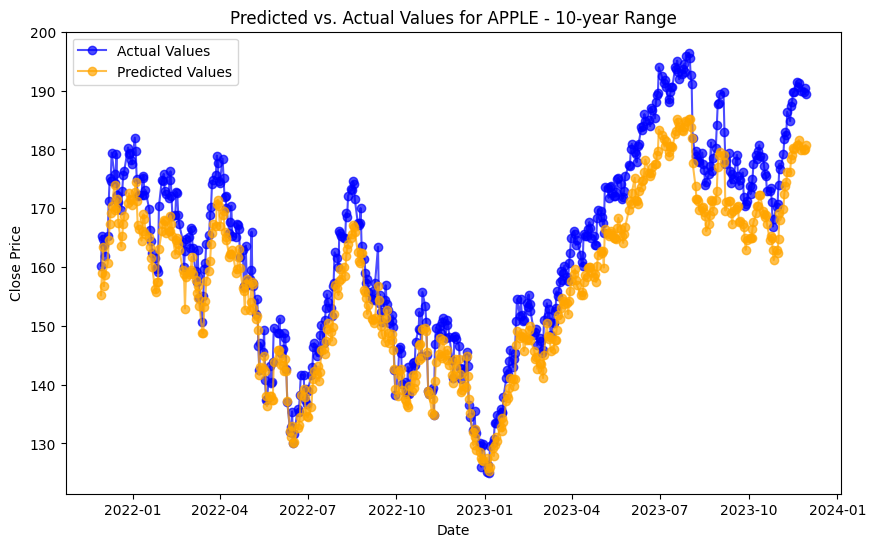


APPLE - 22-year Range - Linear Regression Evaluation:
  MSE: 0.840752793003686
  MAE: 0.6772524169731524
  RMSE: 0.9169257292734706
  MAPE: 0.5374204032986272
  R2 Score: 0.9994762859375663


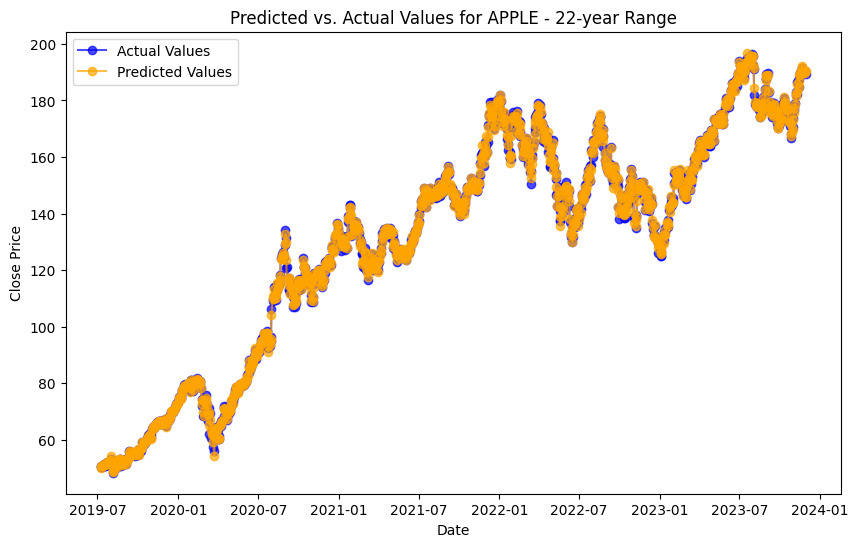


APPLE - 22-year Range - Decision Trees Evaluation:
  MSE: 6882.474976911606
  MAE: 72.99668826092882
  RMSE: 82.96068331994142
  MAPE: 49.73717840532619
  R2 Score: -3.287168546748597


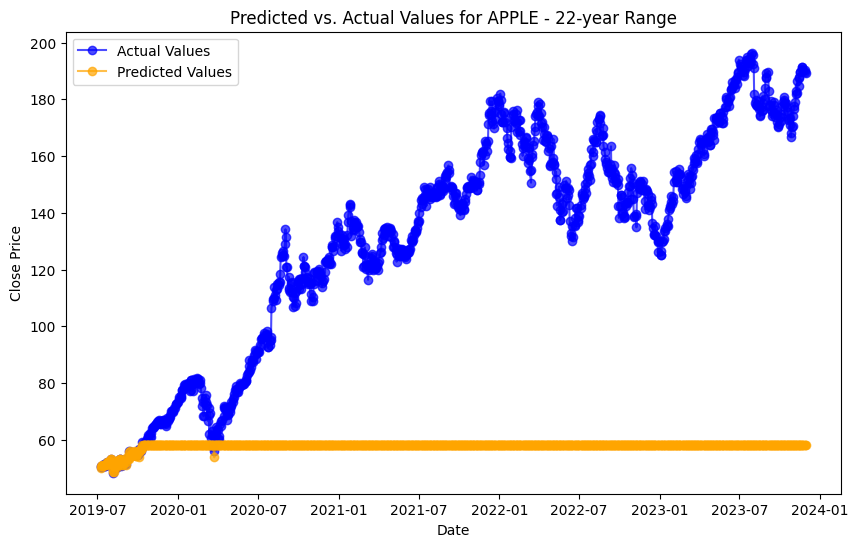

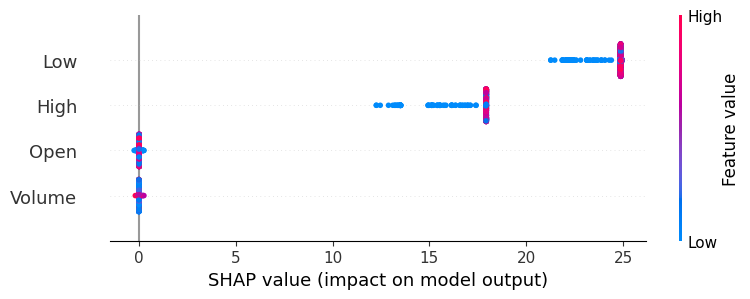

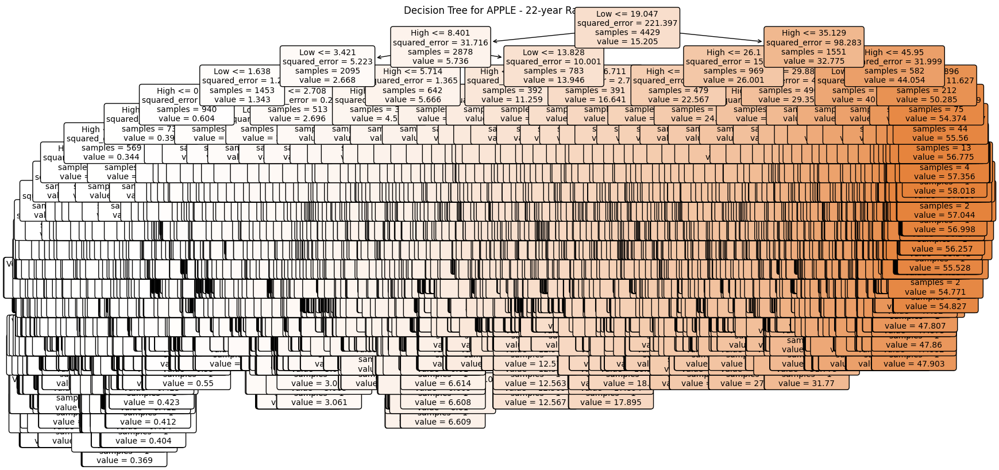

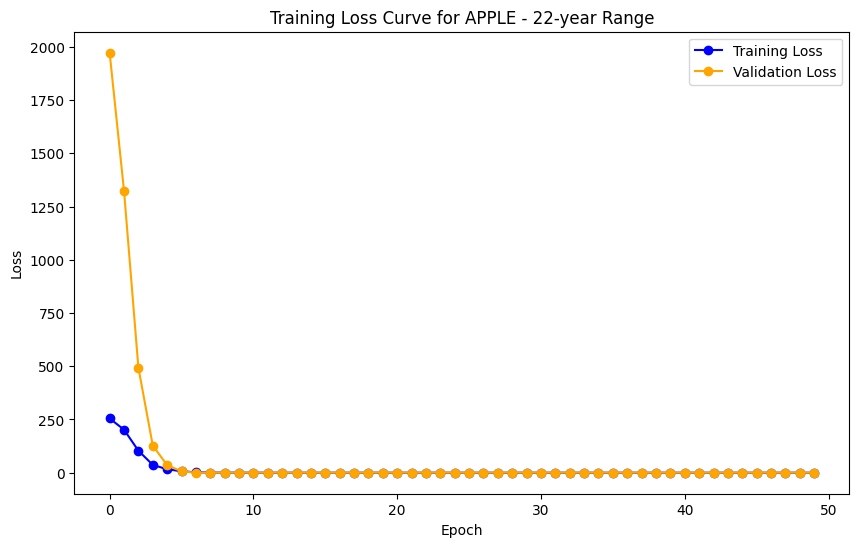

35/35 [==============================] - 0s 2ms/step

APPLE - 22-year Range - LSTM Evaluation:
  MSE: 22.842760189531806
  MAE: 3.8483018289834585
  RMSE: 4.779410025257491
  MAPE: 41.843175522185334
  R2 Score: 0.9857709961410674


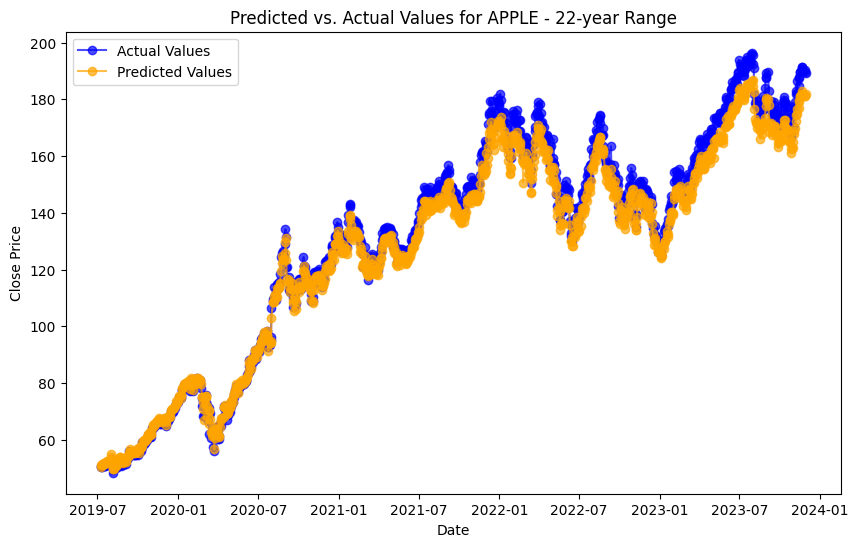

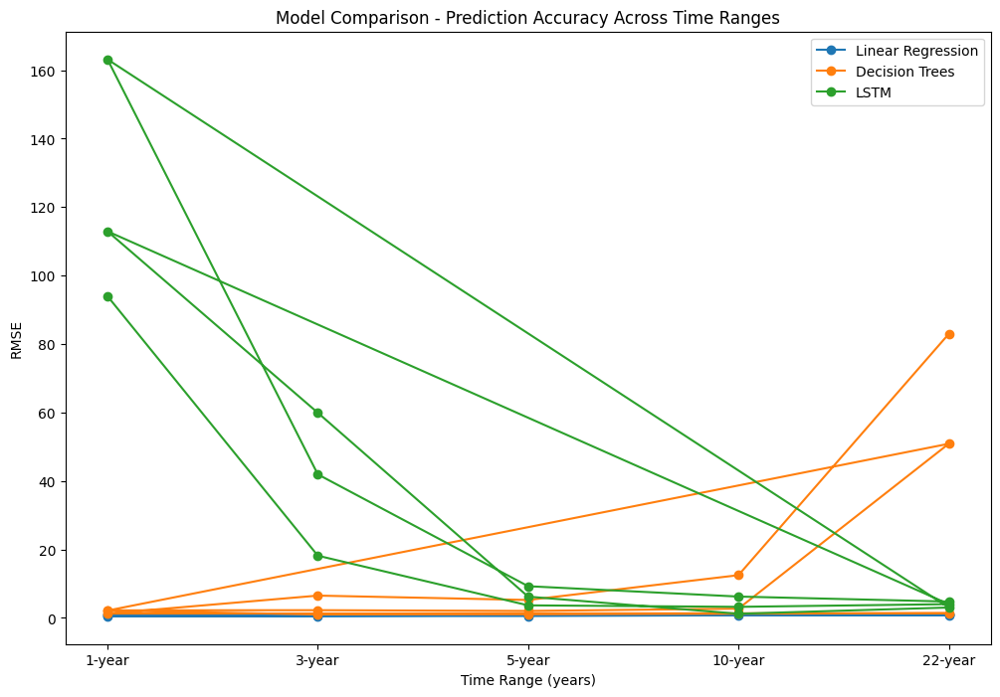


1. Accuracy Analysis for Each Company - Time Frame Basis:

AMD:

1-year Range:
+-------------------+------------+-----------+-----------+-------------+-----------+
| Model             |        MSE |       MAE |      RMSE |    R2 Score |      MAPE |
+===================+============+===========+===========+=============+===========+
| Linear Regression |    0.84937 |  0.768062 |  0.921613 |    0.989419 |  0.726038 |
+-------------------+------------+-----------+-----------+-------------+-----------+
| Decision Trees    |    4.89371 |  1.70137  |  2.21217  |    0.939037 |  1.56892  |
+-------------------+------------+-----------+-----------+-------------+-----------+
| LSTM              | 8833.46    | 93.7538   | 93.9865   | -109.041    | 86.9162   |
+-------------------+------------+-----------+-----------+-------------+-----------+


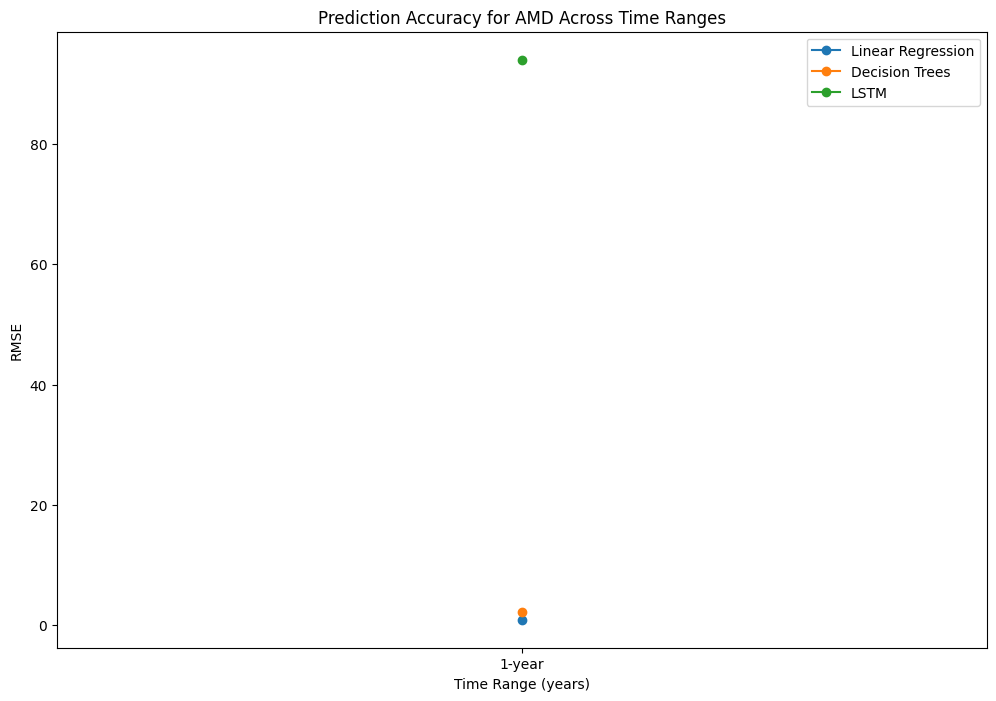


3-year Range:
+-------------------+-----------+-----------+----------+------------+-----------+
| Model             |       MSE |       MAE |     RMSE |   R2 Score |      MAPE |
+===================+===========+===========+==========+============+===========+
| Linear Regression |   1.28049 |  0.892871 |  1.13159 |   0.985599 |  0.826677 |
+-------------------+-----------+-----------+----------+------------+-----------+
| Decision Trees    |   5.11875 |  1.64907  |  2.26246 |   0.942431 |  1.52051  |
+-------------------+-----------+-----------+----------+------------+-----------+
| LSTM              | 330.534   | 17.585    | 18.1806  |  -2.71739  | 17.7504   |
+-------------------+-----------+-----------+----------+------------+-----------+


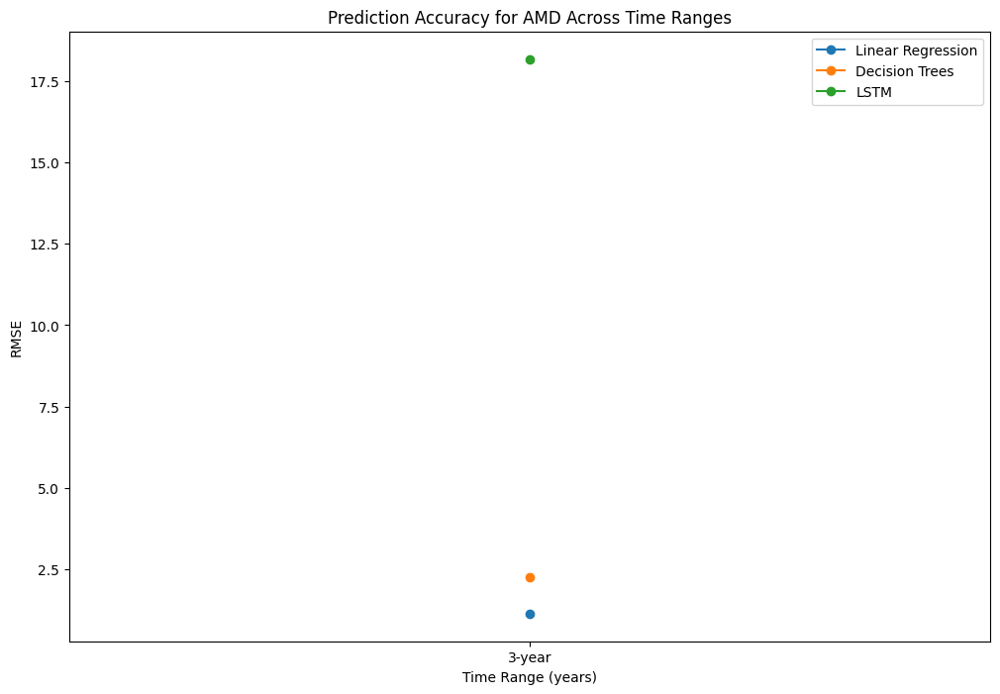


5-year Range:
+-------------------+----------+----------+---------+------------+-----------+
| Model             |      MSE |      MAE |    RMSE |   R2 Score |      MAPE |
+===================+==========+==========+=========+============+===========+
| Linear Regression |  1.09902 | 0.817415 | 1.04834 |   0.99632  |  0.849674 |
+-------------------+----------+----------+---------+------------+-----------+
| Decision Trees    |  4.14491 | 1.5156   | 2.03591 |   0.986122 |  1.56735  |
+-------------------+----------+----------+---------+------------+-----------+
| LSTM              | 13.488   | 3.01513  | 3.67259 |   0.954839 | 21.5313   |
+-------------------+----------+----------+---------+------------+-----------+


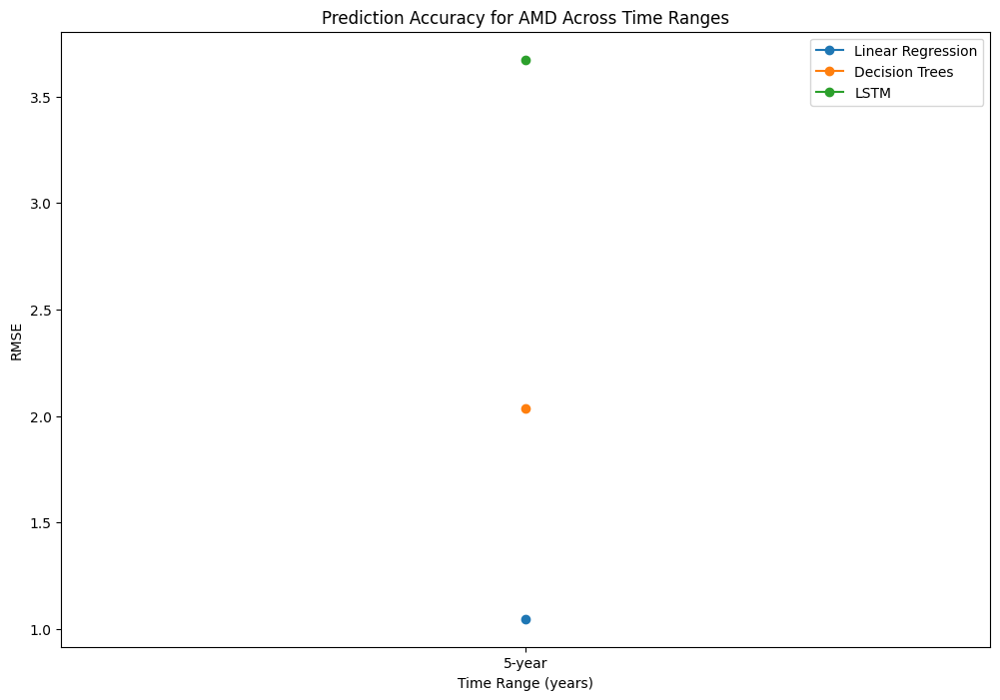


10-year Range:
+-------------------+----------+---------+---------+------------+----------+
| Model             |      MSE |     MAE |    RMSE |   R2 Score |     MAPE |
+===================+==========+=========+=========+============+==========+
| Linear Regression |  1.64253 | 0.9848  | 1.28161 |   0.996473 |  1.01362 |
+-------------------+----------+---------+---------+------------+----------+
| Decision Trees    |  7.34742 | 1.93901 | 2.71061 |   0.984222 |  2.0392  |
+-------------------+----------+---------+---------+------------+----------+
| LSTM              | 10.4594  | 2.35517 | 3.2341  |   0.97754  | 26.5383  |
+-------------------+----------+---------+---------+------------+----------+


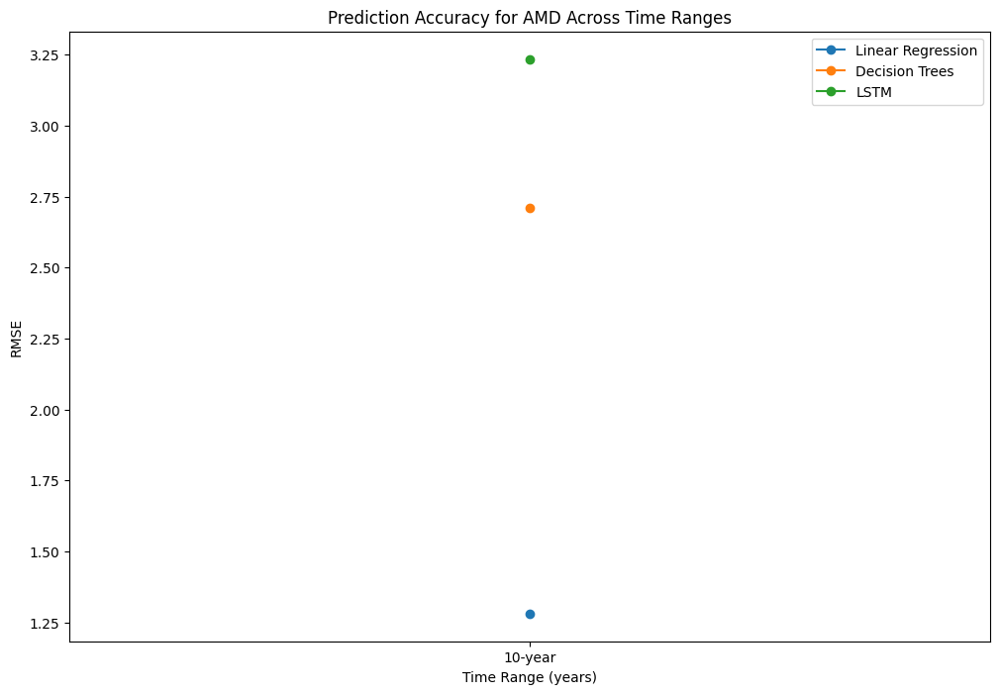


22-year Range:
+-------------------+------------+-----------+----------+------------+-----------+
| Model             |        MSE |       MAE |     RMSE |   R2 Score |      MAPE |
+===================+============+===========+==========+============+===========+
| Linear Regression |    1.11568 |  0.754288 |  1.05626 |   0.998652 |  0.909298 |
+-------------------+------------+-----------+----------+------------+-----------+
| Decision Trees    | 2588.35    | 42.9146   | 50.8758  |  -2.12819  | 44.7544   |
+-------------------+------------+-----------+----------+------------+-----------+
| LSTM              |   16.1933  |  2.94816  |  4.02409 |   0.980429 | 46.6224   |
+-------------------+------------+-----------+----------+------------+-----------+


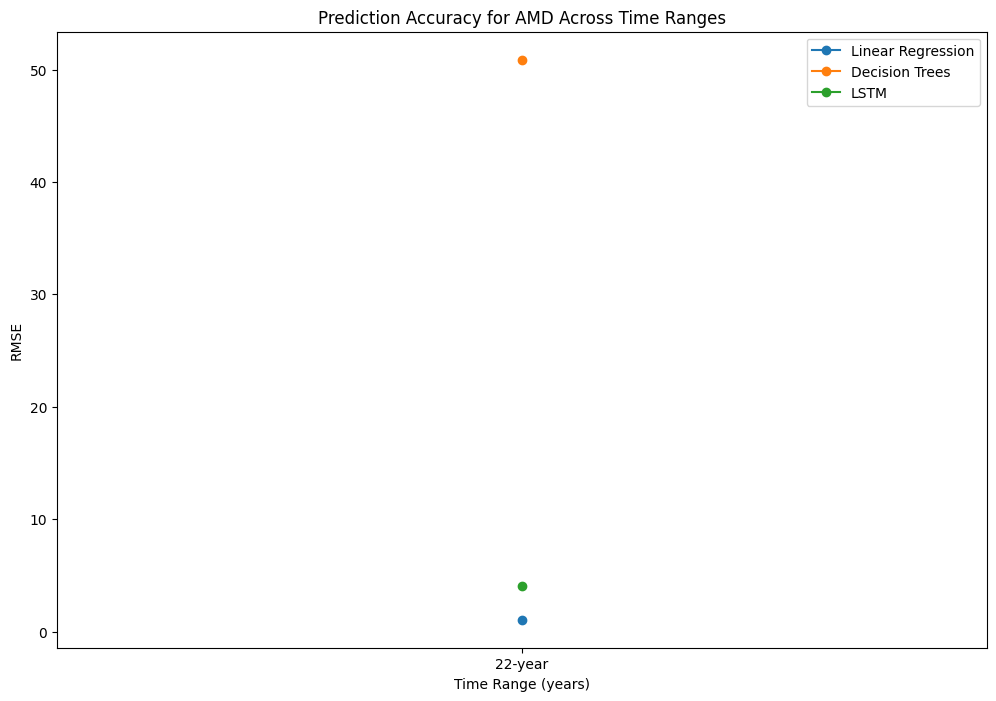


ELECTRONIC ARTS:

1-year Range:
+-------------------+--------------+------------+------------+-------------+-----------+
| Model             |          MSE |        MAE |       RMSE |    R2 Score |      MAPE |
+===================+==============+============+============+=============+===========+
| Linear Regression |     0.256254 |   0.418106 |   0.506215 |    0.992875 |  0.327605 |
+-------------------+--------------+------------+------------+-------------+-----------+
| Decision Trees    |     4.6113   |   1.51059  |   2.14739  |    0.871787 |  1.15934  |
+-------------------+--------------+------------+------------+-------------+-----------+
| LSTM              | 12754.3      | 112.922    | 112.935    | -353.621    | 88.5394   |
+-------------------+--------------+------------+------------+-------------+-----------+


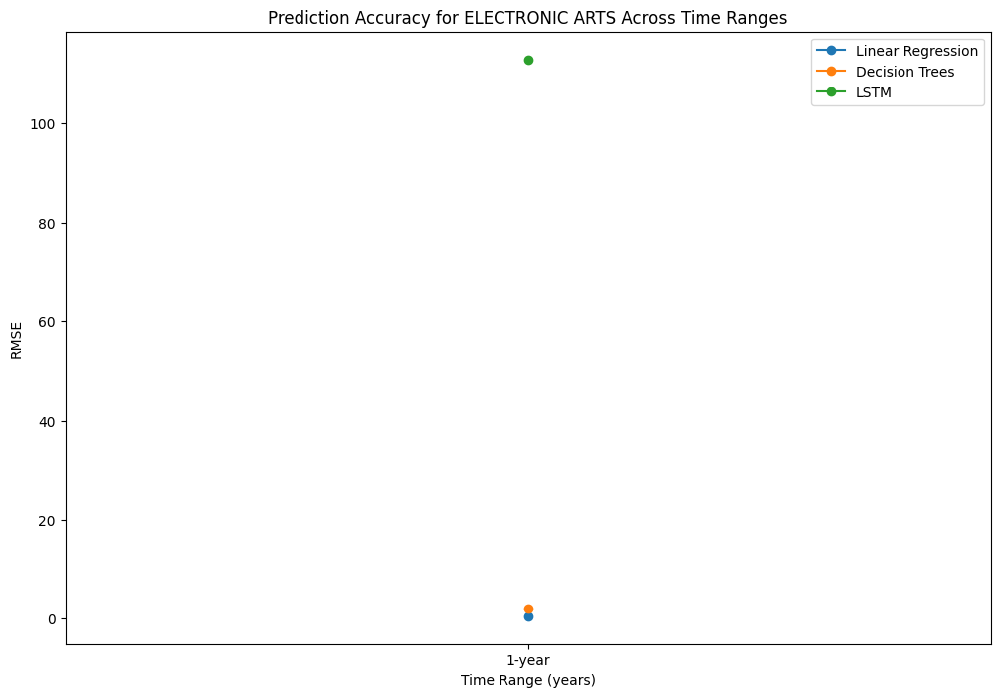


3-year Range:
+-------------------+------------+-----------+-----------+-------------+-----------+
| Model             |        MSE |       MAE |      RMSE |    R2 Score |      MAPE |
+===================+============+===========+===========+=============+===========+
| Linear Regression |    0.28393 |  0.437327 |  0.532851 |    0.991328 |  0.343445 |
+-------------------+------------+-----------+-----------+-------------+-----------+
| Decision Trees    |    1.0299  |  0.79543  |  1.01484  |    0.968544 |  0.626351 |
+-------------------+------------+-----------+-----------+-------------+-----------+
| LSTM              | 3591.99    | 59.0437   | 59.9332   | -108.708    | 46.3823   |
+-------------------+------------+-----------+-----------+-------------+-----------+


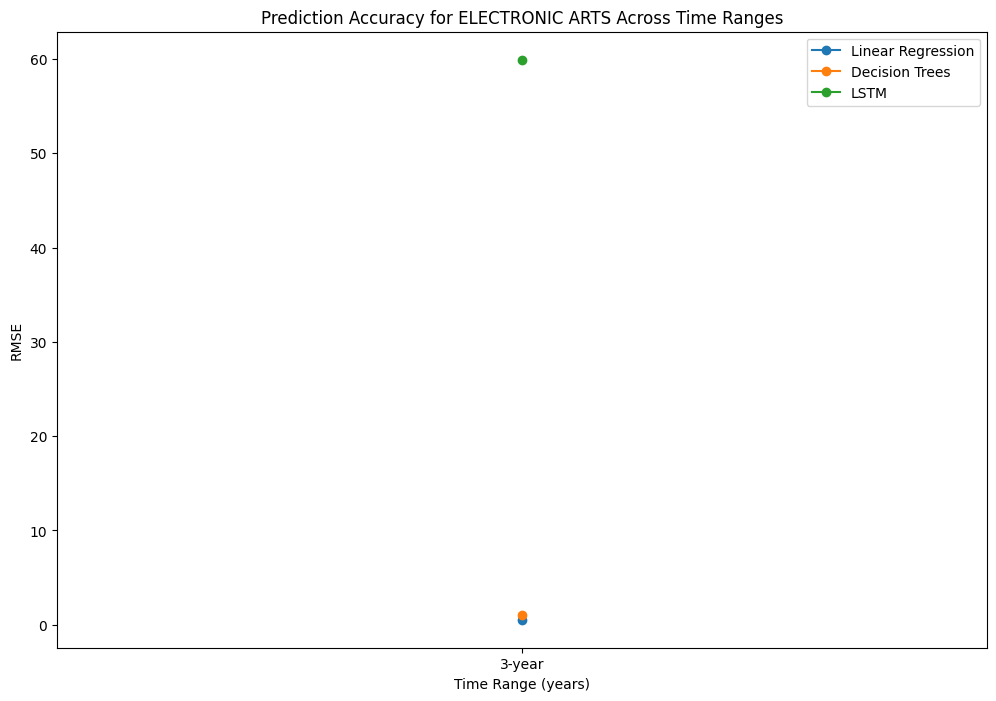


5-year Range:
+-------------------+-----------+----------+----------+------------+----------+
| Model             |       MSE |      MAE |     RMSE |   R2 Score |     MAPE |
+===================+===========+==========+==========+============+==========+
| Linear Regression |  0.310719 | 0.434033 | 0.557422 |   0.993486 | 0.348292 |
+-------------------+-----------+----------+----------+------------+----------+
| Decision Trees    |  1.14783  | 0.839563 | 1.07137  |   0.975938 | 0.683194 |
+-------------------+-----------+----------+----------+------------+----------+
| LSTM              | 38.6504   | 4.8192   | 6.21694  |   0.189762 | 9.21826  |
+-------------------+-----------+----------+----------+------------+----------+


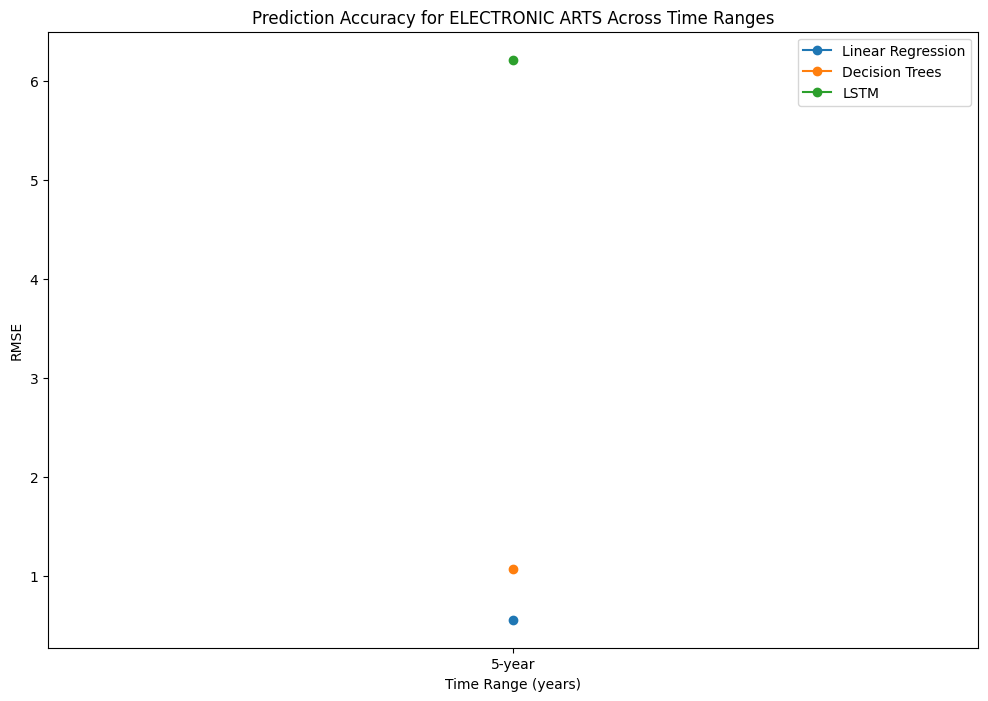


10-year Range:
+-------------------+----------+----------+----------+------------+----------+
| Model             |      MSE |      MAE |     RMSE |   R2 Score |     MAPE |
+===================+==========+==========+==========+============+==========+
| Linear Regression | 0.579225 | 0.579173 | 0.761068 |   0.986033 | 0.457318 |
+-------------------+----------+----------+----------+------------+----------+
| Decision Trees    | 1.51879  | 0.944603 | 1.23239  |   0.963376 | 0.747632 |
+-------------------+----------+----------+----------+------------+----------+
| LSTM              | 1.47569  | 0.933944 | 1.21478  |   0.964416 | 5.67585  |
+-------------------+----------+----------+----------+------------+----------+


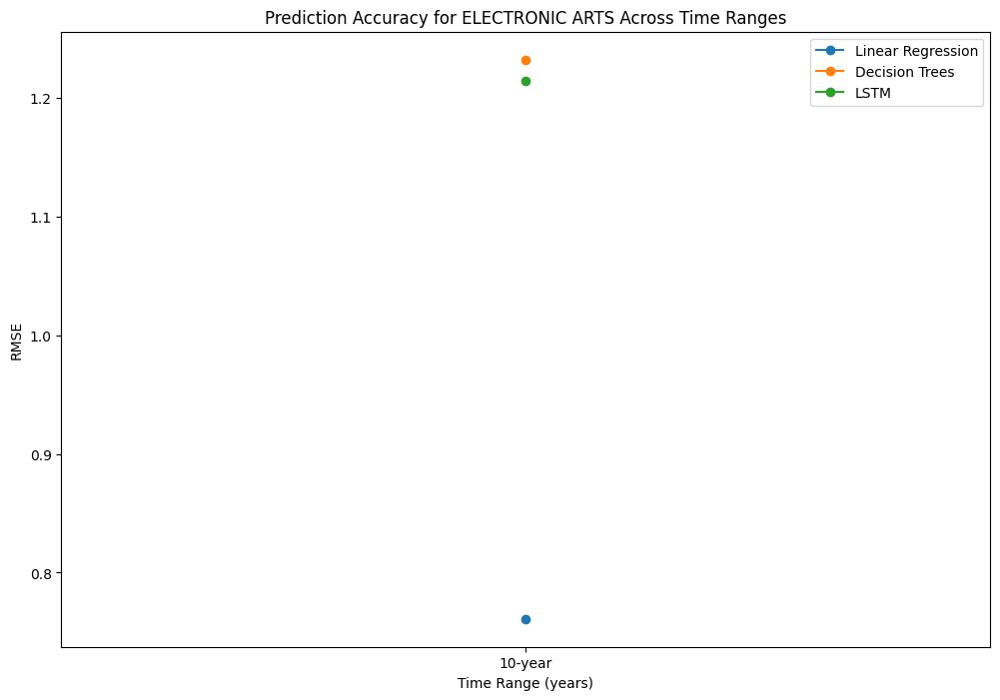


22-year Range:
+-------------------+----------+----------+----------+------------+-----------+
| Model             |      MSE |      MAE |     RMSE |   R2 Score |      MAPE |
+===================+==========+==========+==========+============+===========+
| Linear Regression | 0.702021 | 0.631086 | 0.837867 |   0.996609 |  0.513418 |
+-------------------+----------+----------+----------+------------+-----------+
| Decision Trees    | 1.90086  | 1.03046  | 1.37872  |   0.990817 |  0.83789  |
+-------------------+----------+----------+----------+------------+-----------+
| LSTM              | 9.22058  | 2.58156  | 3.03654  |   0.955455 | 12.7682   |
+-------------------+----------+----------+----------+------------+-----------+


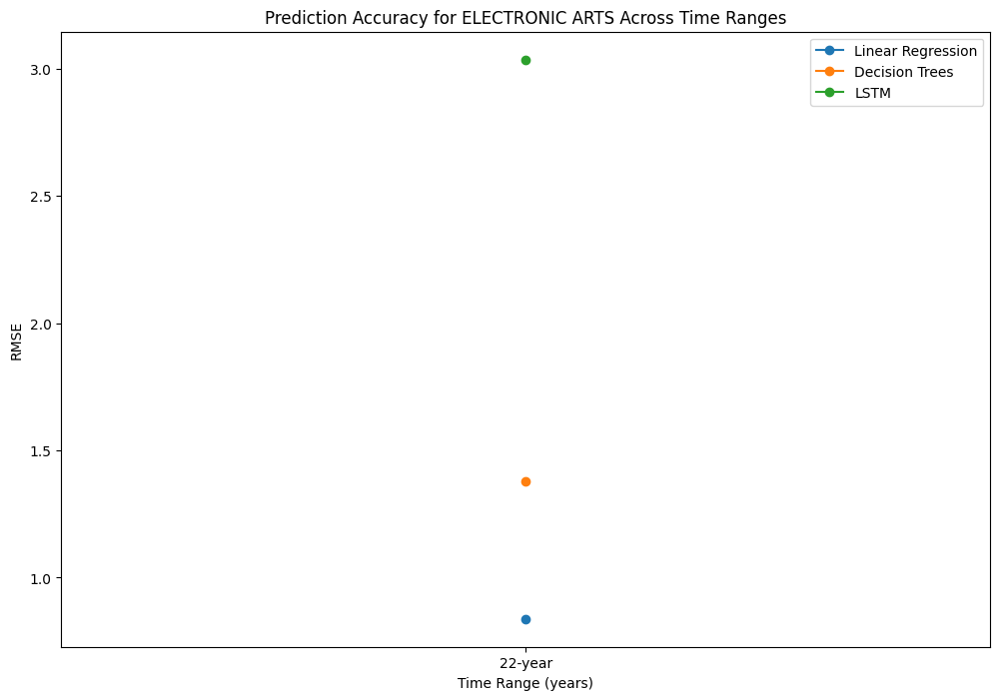


APPLE:

1-year Range:
+-------------------+--------------+------------+------------+-------------+-----------+
| Model             |          MSE |        MAE |       RMSE |    R2 Score |      MAPE |
+===================+==============+============+============+=============+===========+
| Linear Regression |     0.523755 |   0.60397  |   0.723709 |    0.989277 |  0.340022 |
+-------------------+--------------+------------+------------+-------------+-----------+
| Decision Trees    |     1.62618  |   0.993724 |   1.27522  |    0.966706 |  0.563948 |
+-------------------+--------------+------------+------------+-------------+-----------+
| LSTM              | 26622.2      | 163.08     | 163.163    | -544.061    | 91.1842   |
+-------------------+--------------+------------+------------+-------------+-----------+


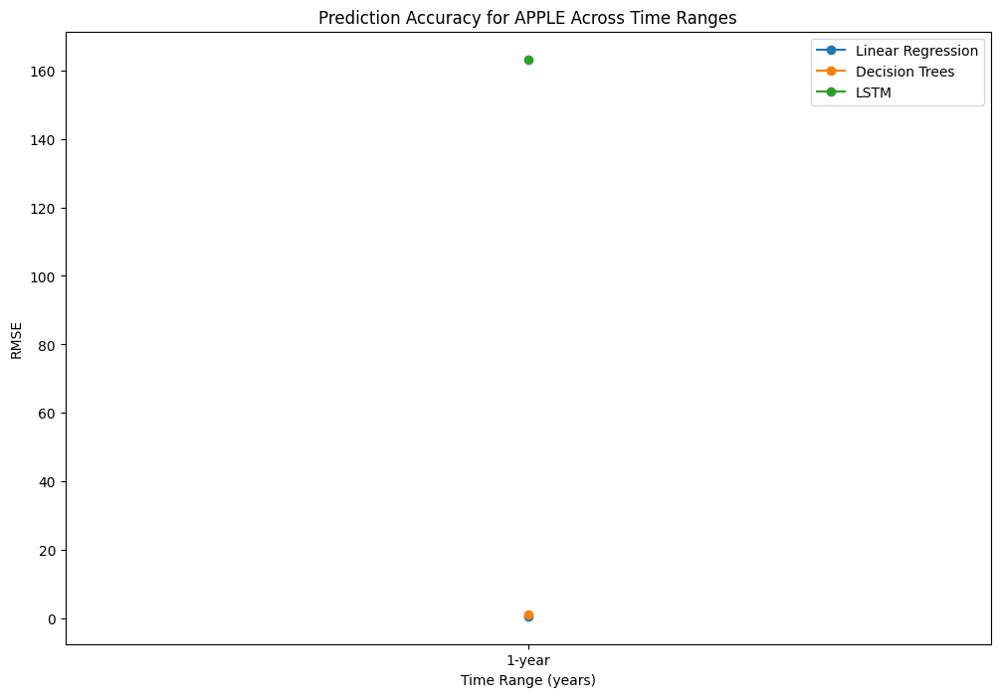


3-year Range:
+-------------------+-------------+-----------+-----------+------------+-----------+
| Model             |         MSE |       MAE |      RMSE |   R2 Score |      MAPE |
+===================+=============+===========+===========+============+===========+
| Linear Regression |    0.540234 |  0.598289 |  0.735006 |   0.991287 |  0.332517 |
+-------------------+-------------+-----------+-----------+------------+-----------+
| Decision Trees    |   42.4986   |  4.45305  |  6.5191   |   0.31461  |  2.36747  |
+-------------------+-------------+-----------+-----------+------------+-----------+
| LSTM              | 1758.53     | 41.4066   | 41.9348   | -27.3604   | 22.7756   |
+-------------------+-------------+-----------+-----------+------------+-----------+


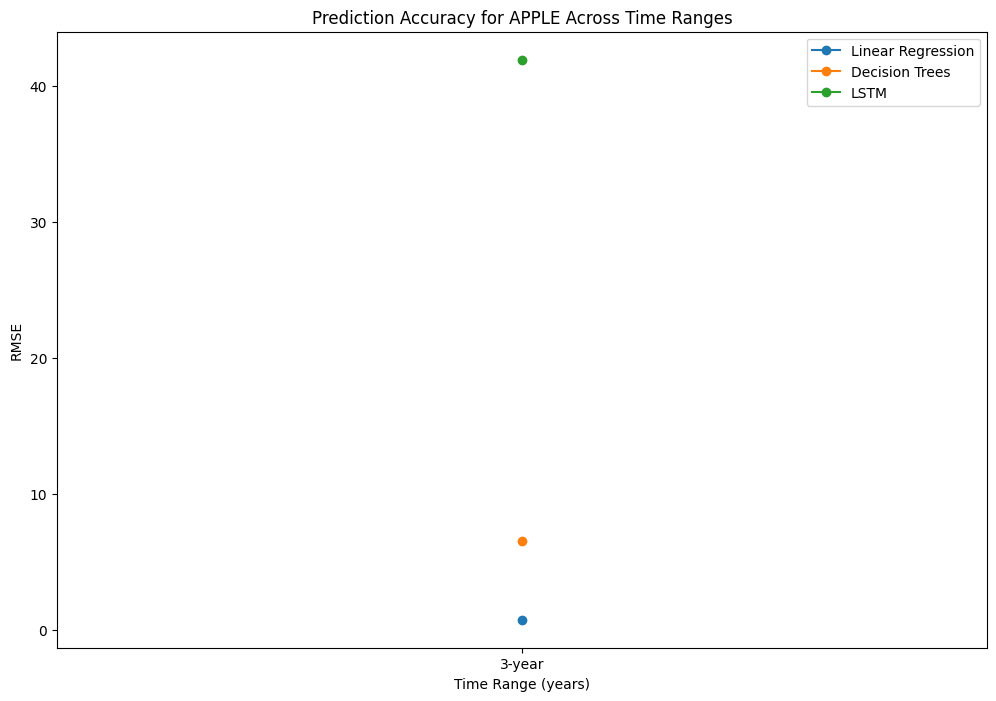


5-year Range:
+-------------------+-----------+----------+----------+------------+-----------+
| Model             |       MSE |      MAE |     RMSE |   R2 Score |      MAPE |
+===================+===========+==========+==========+============+===========+
| Linear Regression |  0.695427 | 0.670298 | 0.833923 |   0.997978 |  0.413099 |
+-------------------+-----------+----------+----------+------------+-----------+
| Decision Trees    | 27.4654   | 3.10558  | 5.24075  |   0.920135 |  1.70877  |
+-------------------+-----------+----------+----------+------------+-----------+
| LSTM              | 85.8328   | 8.84173  | 9.2646   |   0.750411 | 12.878    |
+-------------------+-----------+----------+----------+------------+-----------+


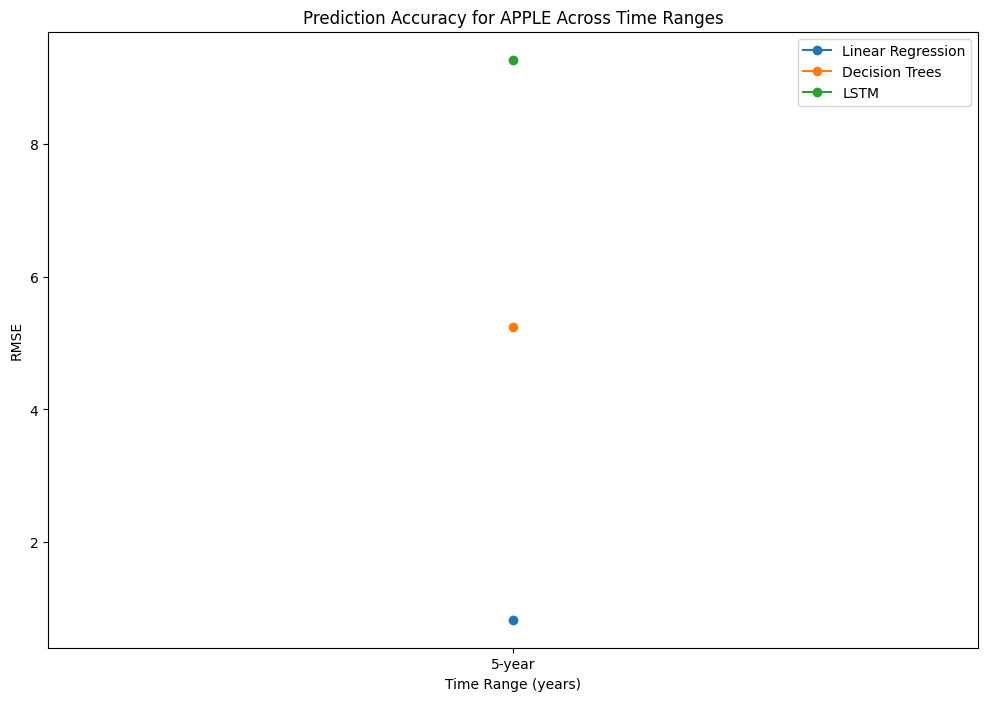


10-year Range:
+-------------------+-----------+----------+----------+------------+-----------+
| Model             |       MSE |      MAE |     RMSE |   R2 Score |      MAPE |
+===================+===========+==========+==========+============+===========+
| Linear Regression |   1.07986 | 0.827446 |  1.03916 |   0.996102 |  0.519974 |
+-------------------+-----------+----------+----------+------------+-----------+
| Decision Trees    | 155.884   | 8.53936  | 12.4854  |   0.437236 |  4.81221  |
+-------------------+-----------+----------+----------+------------+-----------+
| LSTM              |  38.9302  | 5.60743  |  6.23941 |   0.859457 | 11.304    |
+-------------------+-----------+----------+----------+------------+-----------+


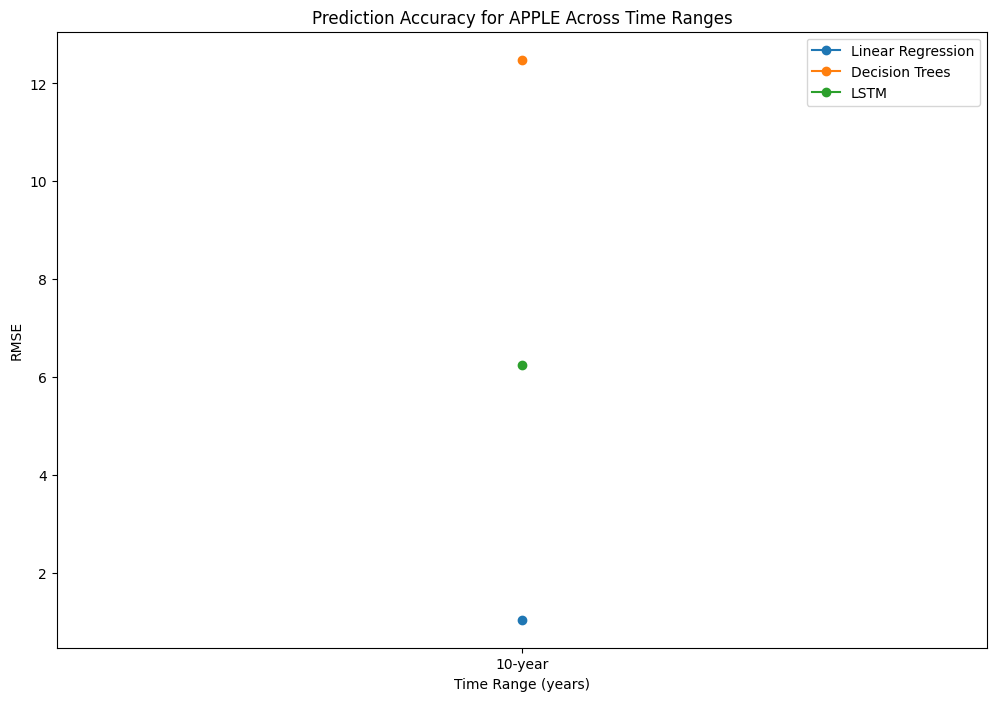


22-year Range:
+-------------------+-------------+-----------+-----------+------------+----------+
| Model             |         MSE |       MAE |      RMSE |   R2 Score |     MAPE |
+===================+=============+===========+===========+============+==========+
| Linear Regression |    0.840753 |  0.677252 |  0.916926 |   0.999476 |  0.53742 |
+-------------------+-------------+-----------+-----------+------------+----------+
| Decision Trees    | 6882.47     | 72.9967   | 82.9607   |  -3.28717  | 49.7372  |
+-------------------+-------------+-----------+-----------+------------+----------+
| LSTM              |   22.8428   |  3.8483   |  4.77941  |   0.985771 | 41.8432  |
+-------------------+-------------+-----------+-----------+------------+----------+


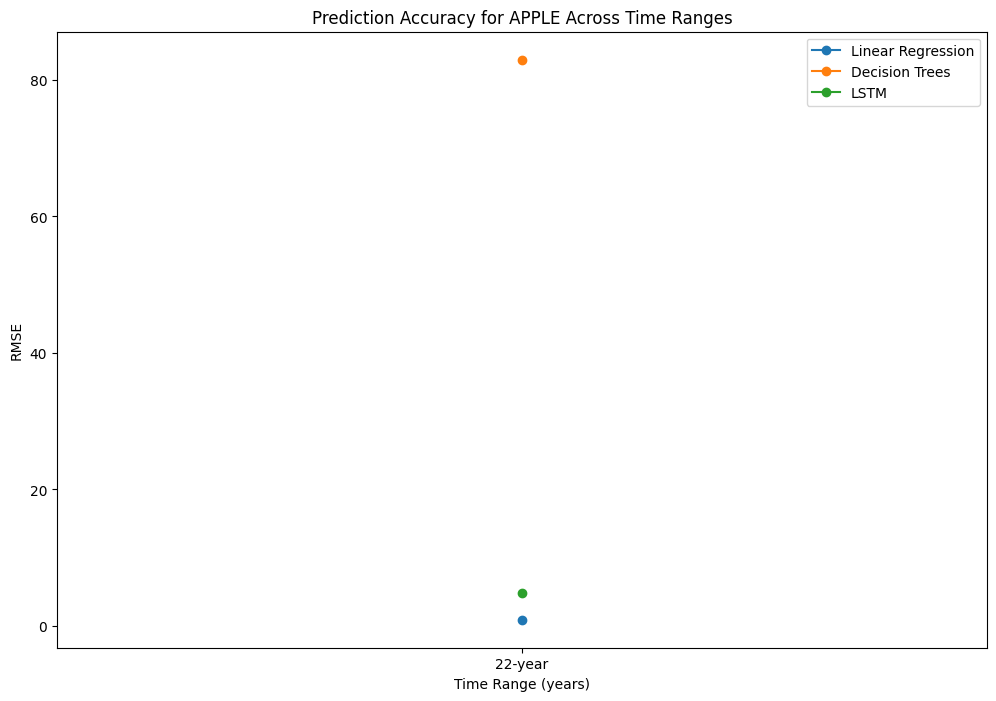


2. Overall Accuracy Analysis - Time Frame Basis:
+--------------+----------+----------+-----------+----------+-------------+
| Time Range   |     RMSE |      MAE |       MSE |     MAPE |    R2 Score |
+==============+==========+==========+===========+==========+=============+
| 1-year       | 41.9856  | 41.7502  | 5358.08   | 30.1473  | -111.219    |
+--------------+----------+----------+-----------+----------+-------------+
| 10-year      |  3.35539 |  2.52344 |   24.3242 |  5.90091 |    0.907206 |
+--------------+----------+----------+-----------+----------+-------------+
| 22-year      | 16.6518  | 14.2647  | 1058.18   | 22.0582  |    0.165761 |
+--------------+----------+----------+-----------+----------+-------------+
| 3-year       | 14.6938  | 14.0957  |  636.867  | 10.325   |  -14.8435   |
+--------------+----------+----------+-----------+----------+-------------+
| 5-year       |  3.32687 |  2.67317 |   19.2038 |  5.46644 |    0.862777 |
+--------------+----------+----------+

Dropping invalid columns in DataFrameGroupBy.mean is deprecated. In a future version, a TypeError will be raised. Before calling .mean, select only columns which should be valid for the function.


In [7]:
# Importing necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
import shap
import matplotlib.pyplot as plt
# Function to calculate mean absolute percentage error
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
# Function for model training and evaluation
def train_and_evaluate_models(train_data, test_data, model_type, company_name, time_range):
    X_train, y_train = train_data[['Open', 'High', 'Low', 'Volume']], train_data['Close']
    X_test, y_test = test_data[['Open', 'High', 'Low', 'Volume']], test_data['Close']
    # Model selection
    if model_type == 'Linear Regression':
        model = LinearRegression()
    elif model_type == 'Decision Trees':
        model = DecisionTreeRegressor(random_state=42)
    elif model_type == 'LSTM':
        # LSTM requires scaled input data
        scaler = MinMaxScaler(feature_range=(0, 1))
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        # Reshaping the input data for LSTM
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))
        # Defining the LSTM model
        model = Sequential()
        model.add(LSTM(50, activation='relu', input_shape=(1, X_train_scaled.shape[1])))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')
    # Training the model
    if model_type != 'LSTM':
        model.fit(X_train, y_train)
    else:
        history = model.fit(X_train_reshaped, y_train, epochs=50, batch_size=32, verbose=0, validation_split=0.1)
        # Plotting training loss curve
        plt.figure(figsize=(10, 6))
        plt.plot(history.history['loss'], label='Training Loss', marker='o', linestyle='-', color='blue')
        plt.plot(history.history['val_loss'], label='Validation Loss', marker='o', linestyle='-', color='orange')
        plt.title(f'Training Loss Curve for {company_name} - {time_range}-year Range')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()
    # Making predictions
    y_pred = model.predict(X_test) if model_type != 'LSTM' else model.predict(X_test_reshaped)
    # Evaluating the model
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"\n{company_name} - {time_range}-year Range - {model_type} Evaluation:")
    print(f"  MSE: {mse}")
    print(f"  MAE: {mae}")
    print(f"  RMSE: {rmse}")
    print(f"  MAPE: {mape}")
    print(f"  R2 Score: {r2}")
    # Visualizing predicted vs. actual values
    plt.figure(figsize=(10, 6))
    plt.plot(test_data.index, y_test, label='Actual Values', marker='o', linestyle='-', color='blue', alpha=0.7)
    plt.plot(test_data.index, y_pred, label='Predicted Values', marker='o', linestyle='-', color='orange', alpha=0.7)
    plt.title(f'Predicted vs. Actual Values for {company_name} - {time_range}-year Range')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.legend()
    plt.show()
    # Feature importance analysis for Decision Trees
    if model_type == 'Decision Trees':
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X_test)
        shap.summary_plot(shap_values, X_test)
        # Visualize the Decision Tree
        plt.figure(figsize=(20, 10))
        plot_tree(model, filled=True, feature_names=['Open', 'High', 'Low', 'Volume'], rounded=True, fontsize=10)
        plt.title(f'Decision Tree for {company_name} - {time_range}-year Range')
        plt.show()
    # Utilizing techniques like SHAP for model interpretability
    if model_type == 'LSTM':
        pass
    return {
        'Company Name': company_name,
        'Model': model_type,
        'Time Range': f'{time_range}-year',
        'MSE': mse,
        'MAE': mae,
        'RMSE': rmse,
        'R2 Score': r2,
        'MAPE': mape
    }
# Function for model training loop
def model_training_loop(data, company_name, time_ranges):
    results = []
    for time_range in time_ranges:
        # Extracting data for the specified time range
        subset_data = data[data.index >= (end - pd.DateOffset(years=time_range))]

        # Train-test split (80% train, 20% test)
        train_data, test_data = train_test_split(subset_data, test_size=0.2, shuffle=False)

        # Training and evaluating models for each type
        for model_type in ['Linear Regression', 'Decision Trees', 'LSTM']:
            result = train_and_evaluate_models(train_data, test_data, model_type, company_name, time_range)
            results.append(result)
    return results
# Function to consolidate and analyze results for model comparison
def consolidate_and_analyze_results(results):
    df_results = pd.DataFrame(results)
    # Plotting model comparison results
    plt.figure(figsize=(12, 8))
    for model_type in ['Linear Regression', 'Decision Trees', 'LSTM']:
        model_results = df_results[df_results['Model'] == model_type]
        plt.plot(model_results['Time Range'], model_results['RMSE'], label=model_type, marker='o')
    plt.title('Model Comparison - Prediction Accuracy Across Time Ranges')
    plt.xlabel('Time Range (years)')
    plt.ylabel('RMSE')
    plt.legend()
    plt.show()
    return df_results
# Function to analyze and visualize model comparison results
def analyze_and_visualize_model_comparison(consolidated_results):
    # 1. Accuracy Analysis for Each Company - Time Frame Basis
    print("\n1. Accuracy Analysis for Each Company - Time Frame Basis:")
    for company_name in company_names:
        print(f"\n{company_name}:")
        for time_range in time_ranges:
            subset_results = consolidated_results[(consolidated_results['Company Name'] == company_name) & (consolidated_results['Time Range'] == f'{time_range}-year')]
            print(f"\n{time_range}-year Range:")
            print(subset_results[['Model', 'MSE', 'MAE', 'RMSE', 'R2 Score', 'MAPE']].to_markdown(index=False, tablefmt="grid"))
            # Create a plot showing the accuracy achieved with different models in different time frames
            plt.figure(figsize=(12, 8))
            for model_type in ['Linear Regression', 'Decision Trees', 'LSTM']:
                subset_model_results = subset_results[subset_results['Model'] == model_type]
                plt.plot(subset_model_results['Time Range'], subset_model_results['RMSE'], label=model_type, marker='o')
            plt.title(f'Prediction Accuracy for {company_name} Across Time Ranges')
            plt.xlabel('Time Range (years)')
            plt.ylabel('RMSE')
            plt.legend()
            plt.show()
    # 2. Overall Accuracy Analysis - Time Frame Basis
    print("\n2. Overall Accuracy Analysis - Time Frame Basis:")
    overall_results = consolidated_results.groupby('Time Range', as_index=False).mean(numeric_only=False)
    print(overall_results[['Time Range', 'RMSE', 'MAE', 'MSE', 'MAPE', 'R2 Score']].to_markdown(index=False, tablefmt="grid"))
    # 3. Overall Accuracy Analysis - Model Basis
    print("\n3. Overall Accuracy Analysis - Model Basis:")
    overall_best_models = consolidated_results.loc[consolidated_results.groupby(['Model', 'Time Range'])['RMSE'].idxmin()]
    print(overall_best_models[['Company Name', 'Time Range', 'Model', 'RMSE']].to_markdown(index=False, tablefmt="grid"))
    # 4. Best Model and Time Frame for Each Company
    print("\n4. Best Model and Time Frame for Each Company:")
    best_time_range_model = consolidated_results.loc[consolidated_results.groupby('Company Name')['RMSE'].idxmin()]
    print(best_time_range_model[['Company Name', 'Time Range', 'Model', 'RMSE']].to_markdown(index=False, tablefmt="grid"))
    # 5. Overall Best Model and Time Frame
    print("\n5. Overall Best Model and Time Frame:")
    overall_best_model = overall_best_models.loc[overall_best_models['RMSE'].idxmin()]
    print(overall_best_model[['Company Name', 'Time Range', 'Model', 'RMSE']].to_markdown(index=False, tablefmt="grid"))
    # 6. Time Frame with Maximum Variability (High Standard Deviation)
    print("\n6. Time Frame with Maximum Variability (High Standard Deviation):")
    for model_type in ['Linear Regression', 'Decision Trees', 'LSTM']:
        max_variability_frame = consolidated_results.loc[consolidated_results.groupby('Model')['RMSE'].idxmax()]
        max_variability_frame_model = max_variability_frame[max_variability_frame['Model'] == model_type]
        print(f"\nFor {model_type}:")
        print(max_variability_frame_model[['Time Range', 'RMSE']].to_markdown(index=False, tablefmt="grid"))
# Applying the function for each company
company_list = [company_list[0], company_list[1], company_list[2]]
company_names = ["AMD", "ELECTRONIC ARTS", "APPLE"]
time_ranges = [1, 3, 5, 10, full_range_years]
all_results = []
for company, company_name in zip(company_list, company_names):
    results = model_training_loop(company, company_name, time_ranges)
    all_results.extend(results)
consolidated_results = consolidate_and_analyze_results(all_results)
analyze_and_visualize_model_comparison(consolidated_results)